Spectral Clustering
-----------------------------

Spectral clustering is a powerful machine learning algorithm for grouping data points into meaningful clusters. It leverages the inherent structure of the data, represented through a similarity matrix, to uncover hidden patterns and group similar points together.

### When to Use Spectral Clustering:

**a. Complex Cluster Shapes:** Spectral clustering shines when dealing with non-convex or irregularly shaped clusters that traditional methods like K-Means struggle with. It excels at identifying clusters that might be nested, intertwined, or have varying densities.

**b. High-Dimensional Data:** When your data lives in high dimensions, it can be difficult to visualize and analyze directly. Spectral clustering can effectively reduce dimensionality while preserving the underlying relationships between data points, leading to better clustering results.

**c. Multi-Modal Data:** This method can handle different data modalities (e.g., text and images) by representing them through appropriate similarity measures, leading to more comprehensive clustering across diverse data types.

### Mathematical Fundamentals:

**a. Similarity Matrix:** Spectral clustering starts by constructing a similarity matrix, where each element represents the similarity between two data points. This matrix encodes the underlying structure of the data.

**b. Eigensystem Analysis:** The algorithm then analyzes the eigenvectors and eigenvalues of the similarity matrix. These values capture the most significant directions of variability in the data.

**c. Dimensionality Reduction:** By selecting specific eigenvectors corresponding to the largest eigenvalues, spectral clustering projects the data points into a lower-dimensional space where clusters become more separable.

**d. Clustering in Lower Dimensions:** In this lower-dimensional space, traditional clustering algorithms (e.g., K-Means) are applied to group data points into the final clusters.

### Computational Algorithm:

**1\. Construct Similarity Matrix:** Calculate the similarity between each pair of data points based on your chosen metric (e.g., Euclidean distance, cosine similarity).

**2\. Compute Eigenvalues and Eigenvectors:** Find the eigenvectors and eigenvalues of the similarity matrix, ranked in descending order based on eigenvalue magnitude.

**3\. Dimensionality Reduction:** Select the desired number of eigenvectors (k) corresponding to the largest eigenvalues and project the data points onto the subspace spanned by these eigenvectors.

**4\. Apply Clustering Algorithm:** Use a traditional clustering algorithm like K-Means on the projected data points to obtain the final clusters.

### Connections to Previous Concepts:

**a. Principal Component Analysis (PCA):** Both techniques use eigenvectors to reduce dimensionality, but PCA focuses on maximizing variance, while spectral clustering emphasizes preserving similarity structure for clustering.

**b. Manifold Learning:** Similar to spectral clustering, manifold learning aims to discover the underlying low-dimensional structure of high-dimensional data. Spectral clustering can be seen as a specific type of manifold learning technique. This is related with the UMAP seen in Lab 1.


DBSCAN: Unveiling Clusters Based on Density
-------------------------------------------

DBSCAN, or Density-Based Spatial Clustering of Applications with Noise, is a powerful unsupervised learning algorithm that identifies clusters of data points based on their local density. Unlike methods like K-Means, it doesn't require pre-defining the number of clusters and effectively handles outliers. 

### When to Use DBSCAN:

**a. Uncovering Irregular Clusters:** DBSCAN excels at finding arbitrarily shaped clusters, be they elongated, intertwined, or nested. Traditional methods like K-Means often struggle with such complexities.

**b. Identifying Outliers:** By explicitly marking points with low density as noise, DBSCAN helps to isolate outliers and analyze the core structure of the data more effectively.

**c. Handling Varying Densities:** Clusters in real-world data often exhibit varying densities. DBSCAN accommodates this by considering both the number of neighbors and their distance to a point when defining clusters.

### Mathematical Fundamentals:

**a. Core Points and Neighbors:** DBSCAN defines two key concepts:

*   **Core Points:** These points have at least `MinPts` neighbors within a distance of `ε`. They serve as the building blocks of clusters.
*   **Neighbors:** Points within `ε` distance of a core point or another neighbor.

**b. Density Reachability and Connectivity:** Two points are directly reachable if one is a neighbor of the other. Points are connected if there's a chain of directly reachable points between them.

**c. Cluster Formation:** A cluster is formed by starting with a core point and recursively adding its connected neighbors and their reachable neighbors, stopping only when density falls below `MinPts`.

### DBSCAN vs. Spectral Clustering:

While both methods tackle unsupervised clustering, their approaches differ significantly:

*   **DBSCAN:** Data-driven, relies on local density around each point. Doesn't explicitly use matrices or dimensionality reduction.
*   **Spectral Clustering:** Global approach, analyzes the entire similarity matrix of the data to find patterns. Employs dimensionality reduction for high-dimensional data.

Despite these differences, there are loose connections:

*   Both consider data point relationships for clustering.
*   Both can uncover non-convex and irregularly shaped clusters.


The Elbow Method: Finding the K-Means Sweet Spot
------------------------------------------------------------------------

The elbow method is a popular technique for determining the optimal number of clusters (k) in the K-Means clustering algorithm. While intuitive and widely used, it's important to understand its limitations and potential pitfalls.

### The Process:

2.  **Run K-Means for various k values:** Calculate the **within-cluster sum of squares (WCSS)** for each k, representing the total distance between data points and their assigned cluster centers.
4.  **Plot WCSS vs. k:** This creates a graph where the x-axis represents the number of clusters and the y-axis represents WCSS.
6.  **Identify the "elbow":** Look for a sharp decrease in WCSS followed by a plateau, resembling an elbow shape. This point suggests the optimal k where adding more clusters provides diminishing returns in terms of reducing distances within clusters.

### The Downsides:

**1\. Subjectivity:** Identifying the "elbow" can be subjective, especially for subtle bends or noisy data. Different analysts might choose different k values based on their interpretation.

**2\. Not Foolproof:** The elbow might not always be clear, especially for datasets with naturally overlapping or poorly separated clusters. The method assumes clusters are well-defined spheres, which might not hold true in reality.

**3\. Dependence on Distance Metric:** The choice of distance metric (e.g., Euclidean, cosine) used to calculate WCSS can influence the shape of the plot and the perceived "elbow."

**4\. Ignores Cluster Quality:** The elbow method solely focuses on within-cluster distances, overlooking cluster separation and overall cluster quality.

### Alternatives to Consider:

*   **Silhouette analysis:** Measures the average similarity of a data point to its own cluster compared to other clusters, providing a silhouette score for different k values.
*   **Gap statistic:** Compares the WCSS of your data to the WCSS of randomly generated data, providing a more objective measure of optimal k.
*   **Domain knowledge:** Incorporating your understanding of the data and its natural groupings can inform the choice of k beyond purely algorithmic measures.

The elbow method is a helpful starting point, but it's crucial to evaluate cluster quality visually and consider alternative methods to ensure selection of the most meaningful number of clusters for the data.

Punto 5
-

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import make_blobs
X, y = make_blobs(
n_samples=500,
n_features=2,
centers=4,
cluster_std=1,
center_box=(-10.0, 10.0),
shuffle=True,
random_state=1,
)


#### Plot the resulting dataset. How many clusters are there? How far are they from one another?

In [4]:
def plot_data(data, title=None):
    plt.scatter(data[:,0], data[:,1])
    if title is not None:
        plt.title(title)
    plt.show()

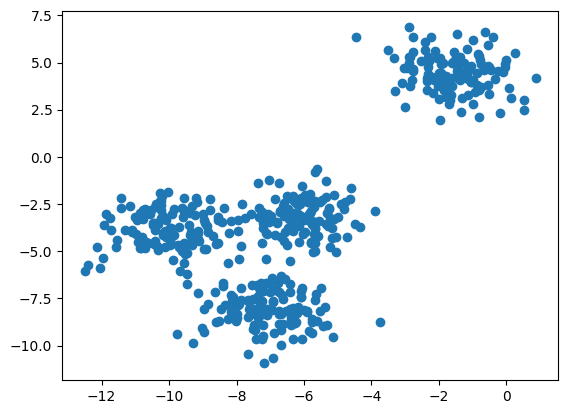

In [5]:
plot_data(X)

Four Distinct Clusters Visible in the Image
-------------------------------------------

Based on the image, it is evident that there are **four distinct clusters** present. Three of these clusters appear to be **positioned closer together**, while the fourth one is **significantly more isolated** from the others.

**Key observations:**

*   **Spatial proximity:** The three closer clusters exhibit a clear **concentration of data points** within a smaller area compared to the isolated cluster. This suggests a **stronger relationship** among the points within each of the closer clusters.
*   **Density:** The isolated cluster might have **fewer data points** compared to the closer clusters, further emphasizing its distinct nature.
*   **Visual separation:** Depending on the nature of the data visualization, there might be **visual cues** like color, shape, or size that reinforce the separation between the clusters.

**Further analysis:**

*   To conclusively determine the optimal number of clusters, it might be beneficial to apply **quantitative clustering techniques** like k-means or hierarchical clustering.


### For both k-means and k-medoids (your implementations), calculate the silhouette plots and coefficients for each run, iterating K from 1 to 5 clusters.

For n_clusters = 1 The average silhouette_score is : 0.10805250221382573
For n_clusters = 2 The average silhouette_score is : 0.40164115751184853
For n_clusters = 3 The average silhouette_score is : 0.5364504610637965
For n_clusters = 4 The average silhouette_score is : 0.785602565609349
For n_clusters = 5 The average silhouette_score is : 0.7342847723105045


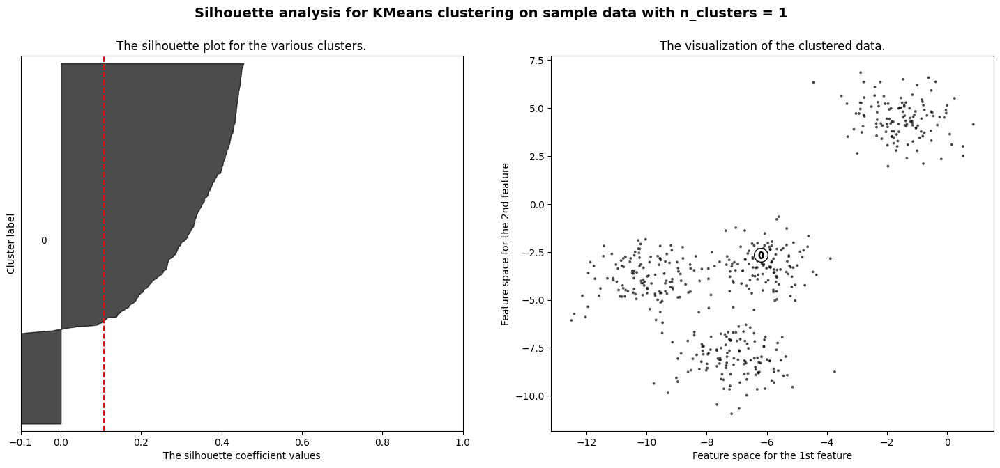

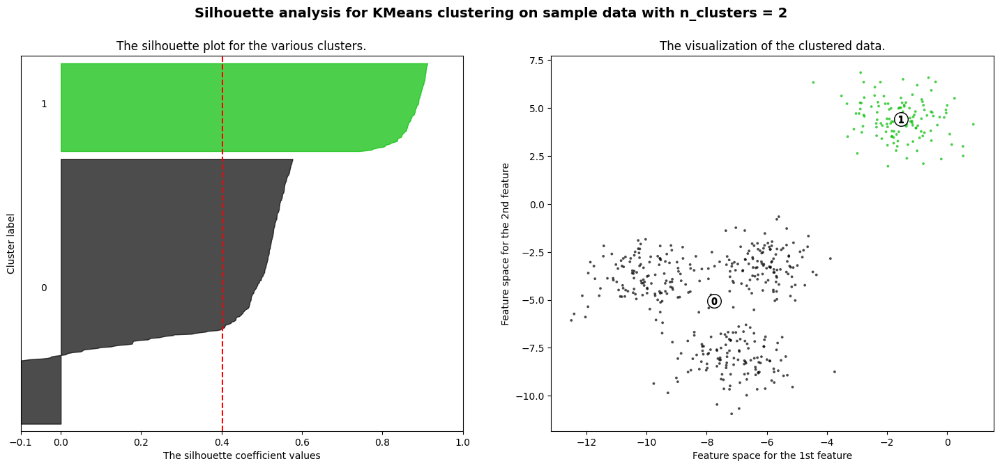

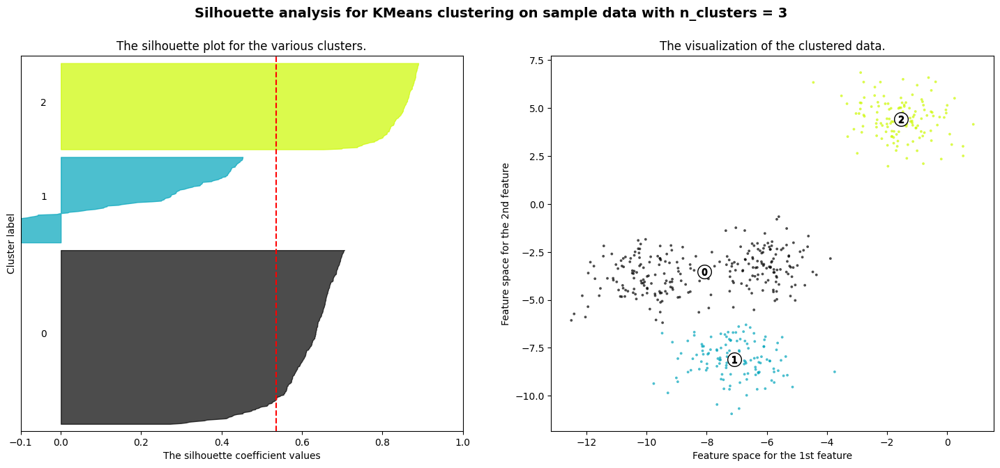

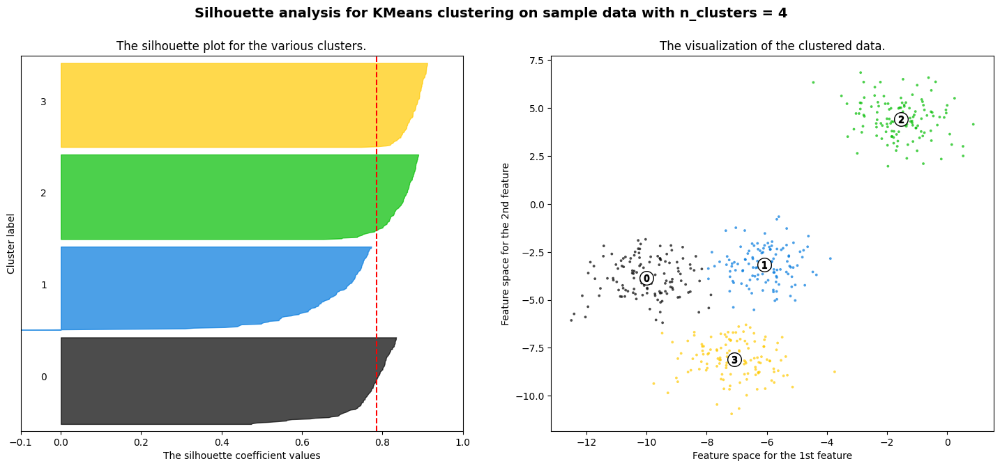

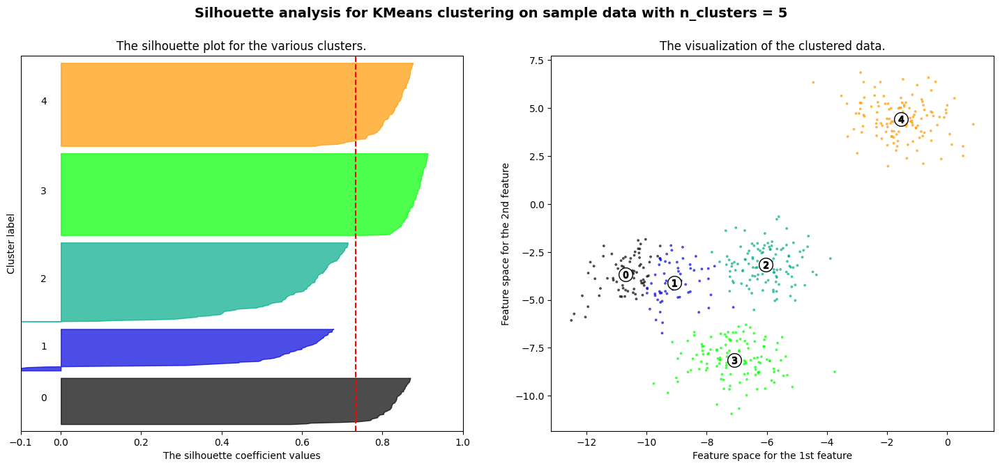

In [2]:
from MachineLearningII.unsupervised.clustering.k_means import KMeans
from MachineLearningII.unsupervised.clustering.silhouette import Sillhouette
for num_clusters in np.arange(start=1, stop=6):
    kmean = KMeans(X, num_clusters)
    centroids, cluster_assignment = kmean.fit(max_iterations=800)
    silouette = Sillhouette(X, cluster_assignment, centroids)
    silouette.calculate_silhouette()
    silouette.plot_silhouette()

K=4 is the Best Fit Using K-Means
---------------------------------

The number of clusters, K, is a hyperparameter that needs to be specified by the user. There are a number of ways to choose the optimal value of K, but one common approach is to use the **silhouette coefficient**.

The silhouette coefficient is a measure of how well a data point is assigned to its cluster. The coefficient is calculated for each data point, and the average silhouette coefficient for all data points is then computed. A higher average silhouette coefficient indicates a better clustering.

In this case, the average silhouette coefficient for K=4 is the highest. This suggests that K=4 is the optimal number of clusters for the data.

**Other factors that support K=4 being the best fit:**

*   The silhouette coefficients of each cluster are very close to the average silhouette coefficient.
*   The widths of the silhouettes of each cluster are approximately similar.

**Conclusion:**

Based on the above analysis, it can be concluded that K=4 is the best fit for the data using K-means.



For n_clusters = 1 The average silhouette_score is : 0.10805250221382573
For n_clusters = 2 The average silhouette_score is : 0.14547060652161617
For n_clusters = 3 The average silhouette_score is : 0.17199003512522226
For n_clusters = 4 The average silhouette_score is : 0.6024199078020229
For n_clusters = 5 The average silhouette_score is : 0.5931836587480591


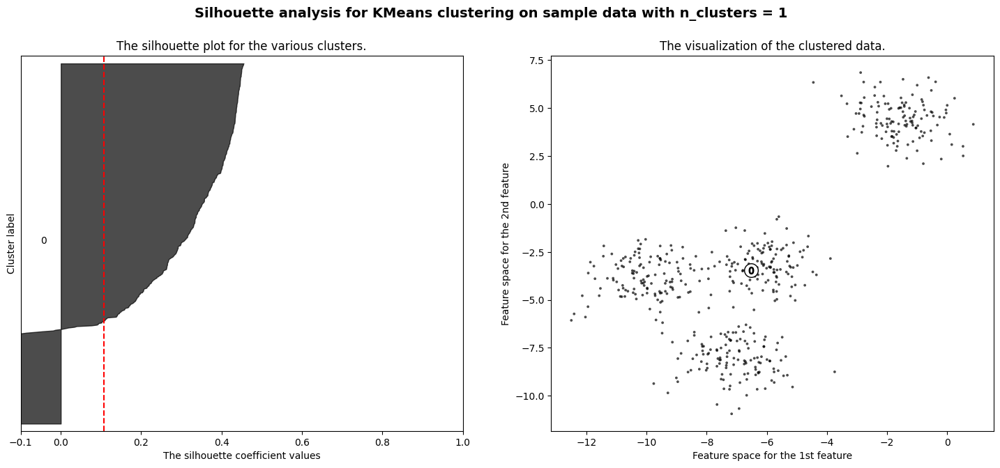

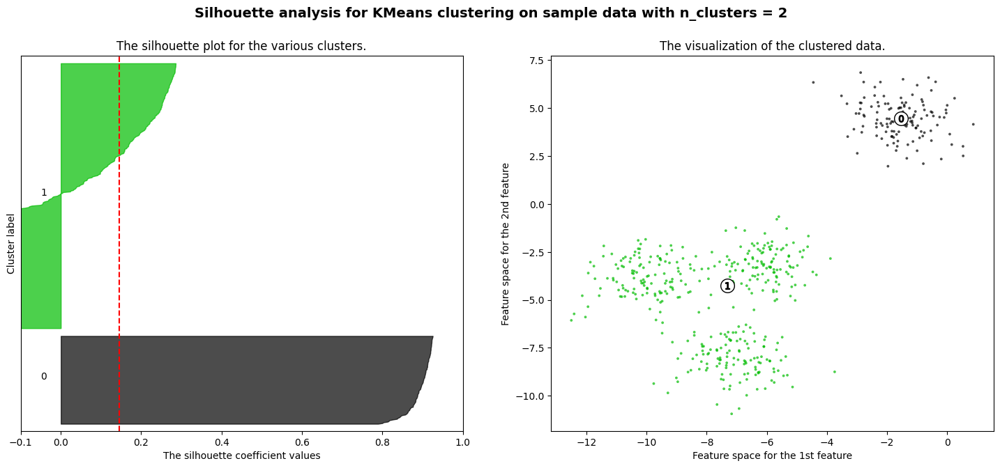

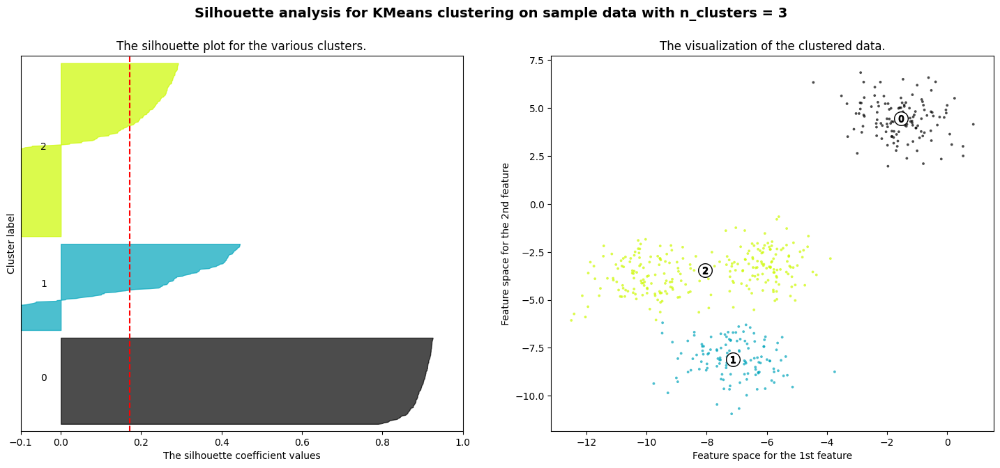

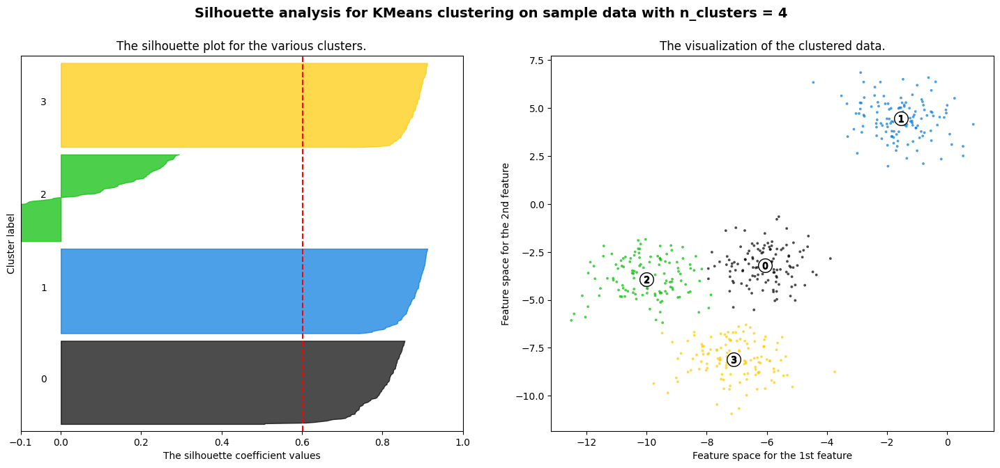

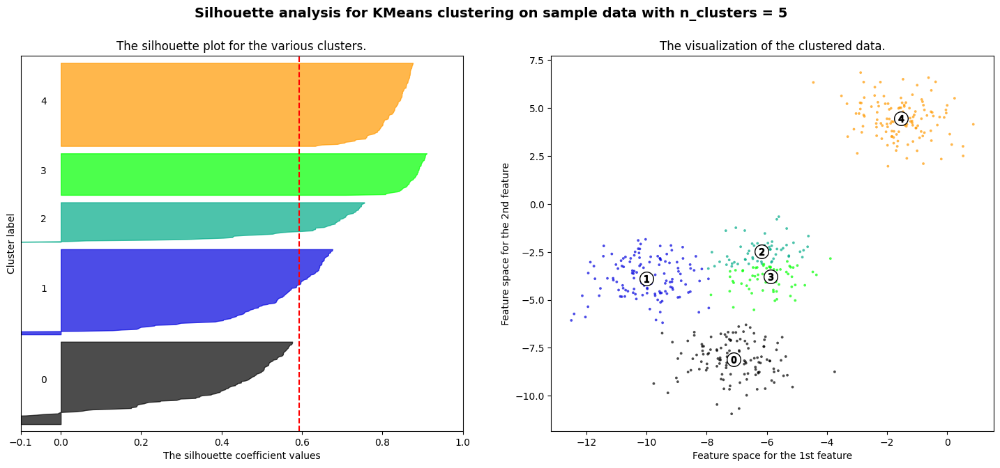

In [3]:
from MachineLearningII.unsupervised.clustering.k_medoids import KMedoids
for num_clusters in np.arange(start=1, stop=6):
    kmedoids = KMedoids(X, num_clusters)
    medoids, cluster_assignment = kmedoids.fit(max_iterations=800)
    silouette = Sillhouette(X, cluster_assignment, medoids)
    silouette.calculate_silhouette()
    silouette.plot_silhouette()

K-Medoids Results Similar to K-Means
------------------------------------

The K-medoids algorithm is a clustering algorithm similar to K-means. However, instead of using the mean of the data points in a cluster as the cluster centroid, K-medoids uses the medoid, which is the data point that is most centrally located within the cluster.

In this case, the results obtained with K-medoids are similar to those obtained with K-means. The optimal value of K is still 4, and the clusters are very similar.

**However, the average silhouette coefficient obtained with K-medoids is lower than that obtained with K-means.** This suggests that the silhouette coefficient could not be a good measure for K-medoids clustering.

**Overall, the results suggest that K-medoids is a viable alternative to K-means.** The data was well clusterize.



In [8]:
import numpy as np
from sklearn import cluster, datasets, mixture
# ============
# Generate datasets. We choose the size big enough to see the scalability
# of the algorithms, but not too big to avoid too long running times
# ============
n_samples = 500
noisy_circles = datasets.make_circles(n_samples=n_samples, factor=0.5, noise=0.05)
noisy_moons = datasets.make_moons(n_samples=n_samples, noise=0.05)
blobs = datasets.make_blobs(n_samples=n_samples, random_state=8)
no_structure = np.random.rand(n_samples, 2), None
# Anisotropically distributed data
random_state = 170
X, y = datasets.make_blobs(n_samples=n_samples, random_state=random_state)
transformation = [[0.6, -0.6], [-0.4, 0.8]]
X_aniso = np.dot(X, transformation)
aniso = (X_aniso, y)
# blobs with varied variances
varied = datasets.make_blobs(
n_samples=n_samples, cluster_std=[1.0, 2.5, 0.5], random_state=random_state
)

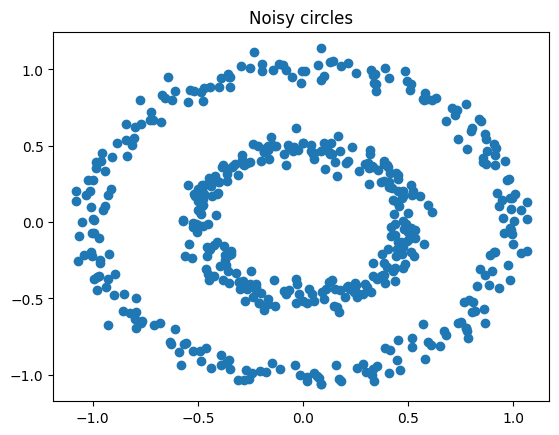

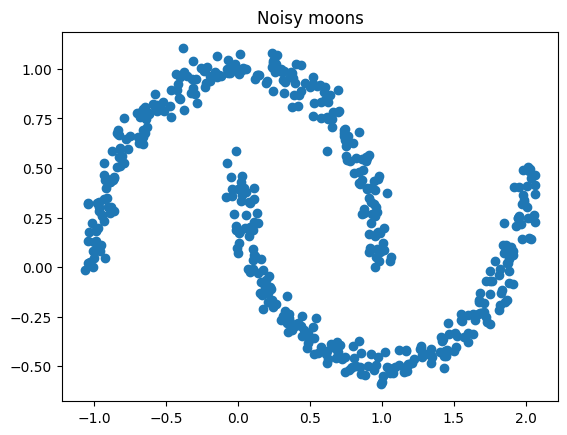

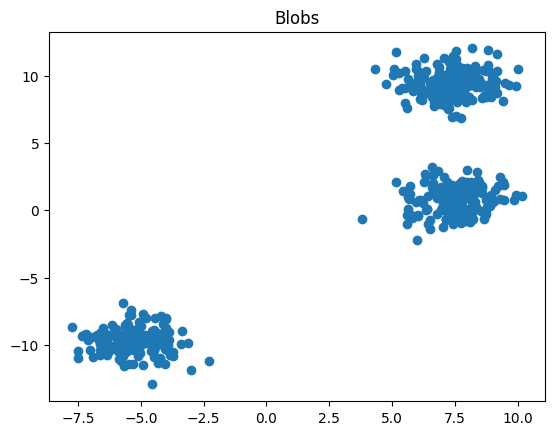

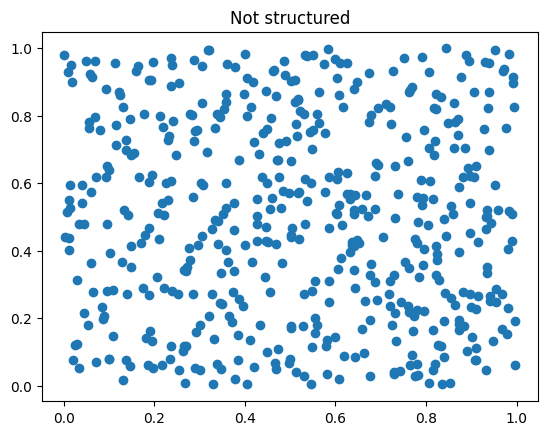

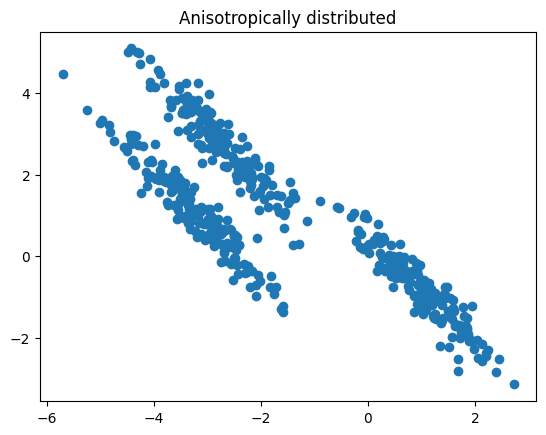

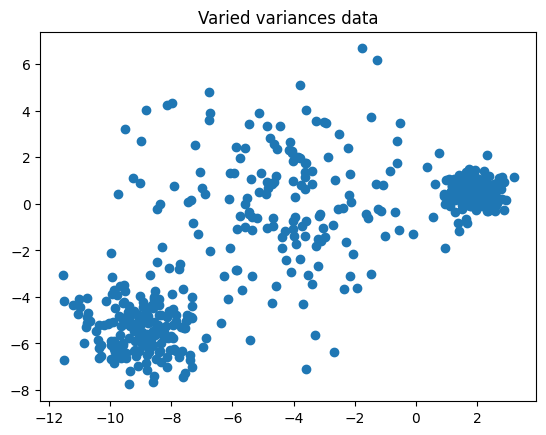

In [8]:
plot_data(noisy_circles[0], 'Noisy circles')
plot_data(noisy_moons[0], 'Noisy moons')
plot_data(blobs[0], 'Blobs')
plot_data(no_structure[0], 'Not structured')
plot_data(aniso[0], 'Anisotropically distributed')
plot_data(varied[0], 'Varied variances data')

In [10]:
datasets = [noisy_circles[0], noisy_moons[0], blobs[0], no_structure[0], aniso[0], varied[0]]

Scikit-learn K-Means
-

/Users/aclicona/Documents/Python/Especializacion/venv/lib/python3.9/site-packages/threadpoolctl.py:1195: RuntimeWarning: libc not found. The ctypes module in Python 3.9 is maybe too old for this OS.
  warnings.warn(


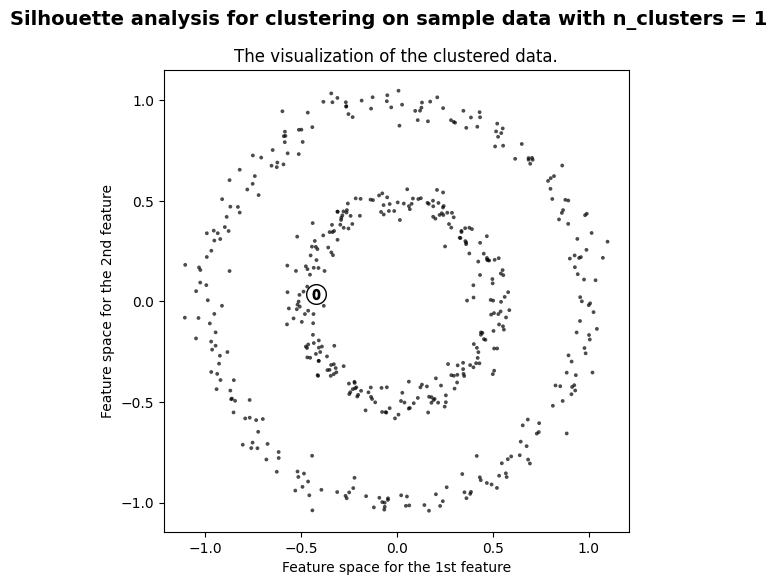

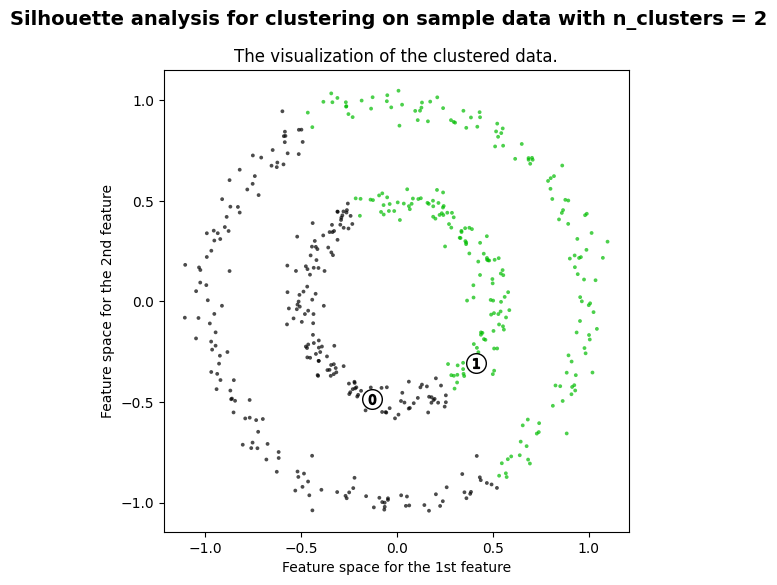

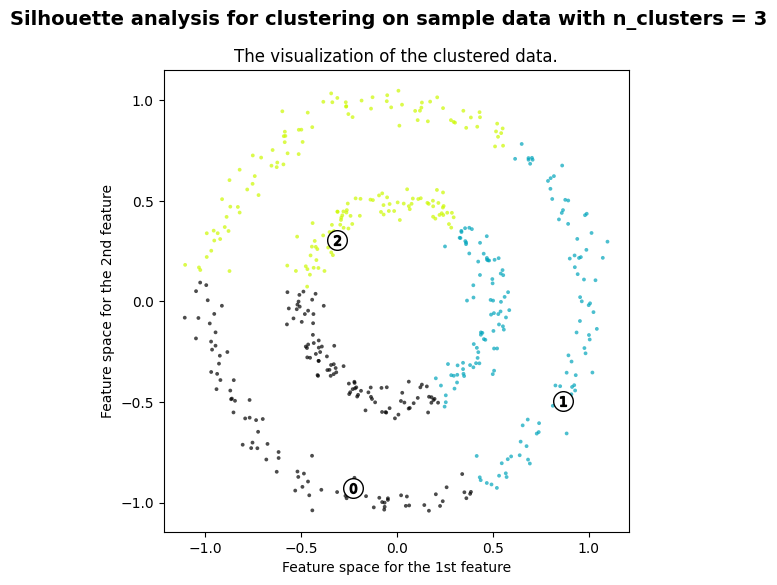

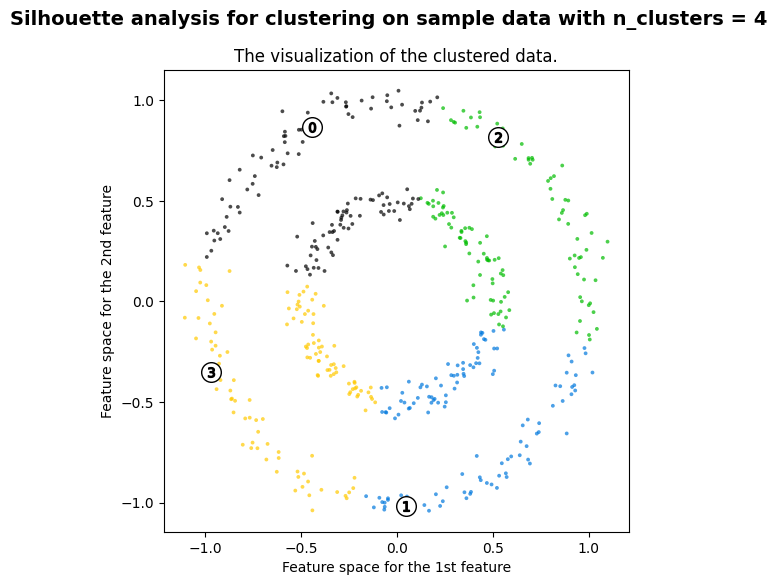

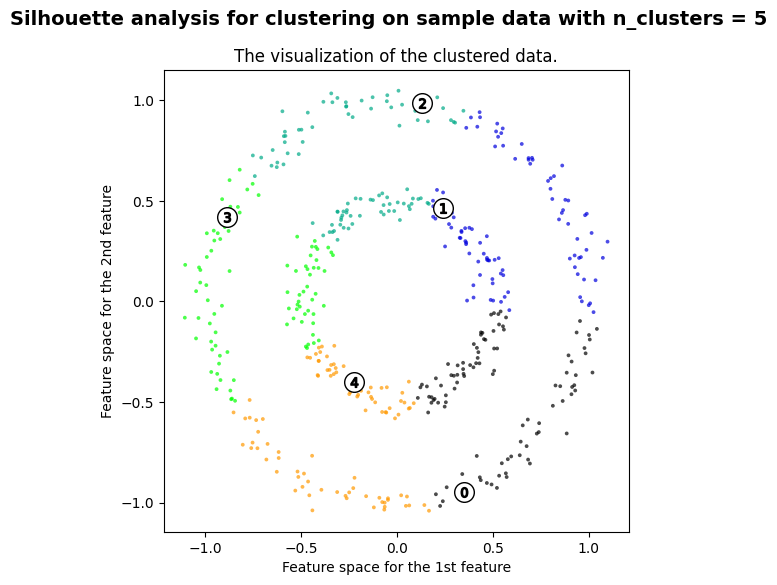

...

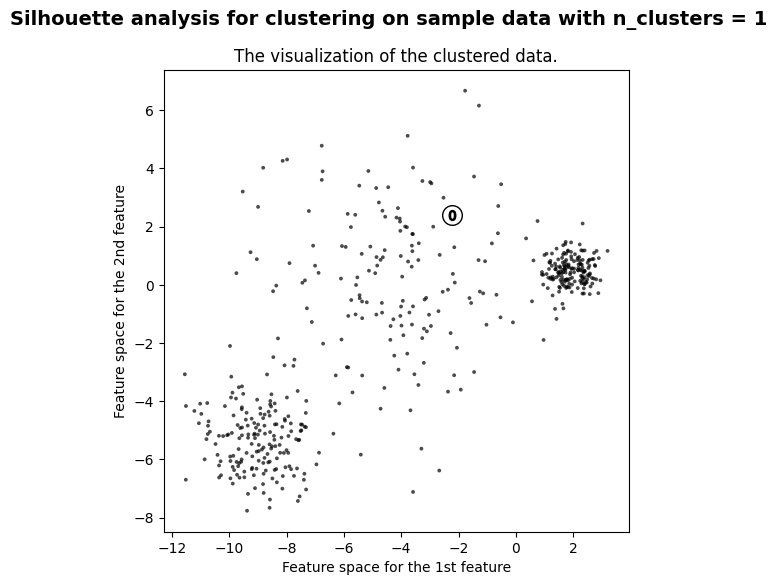

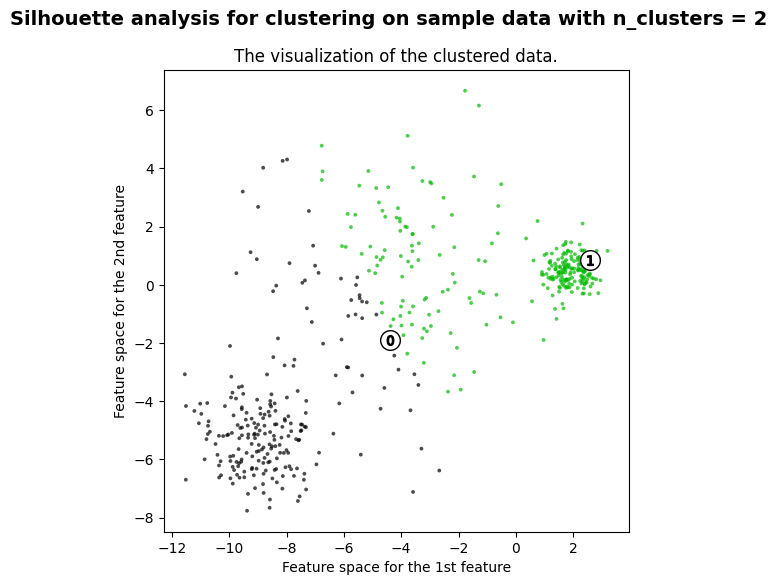

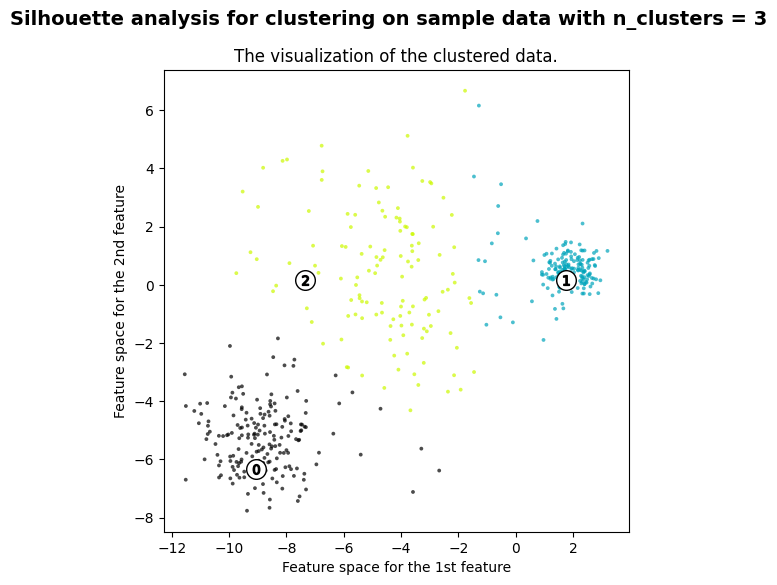

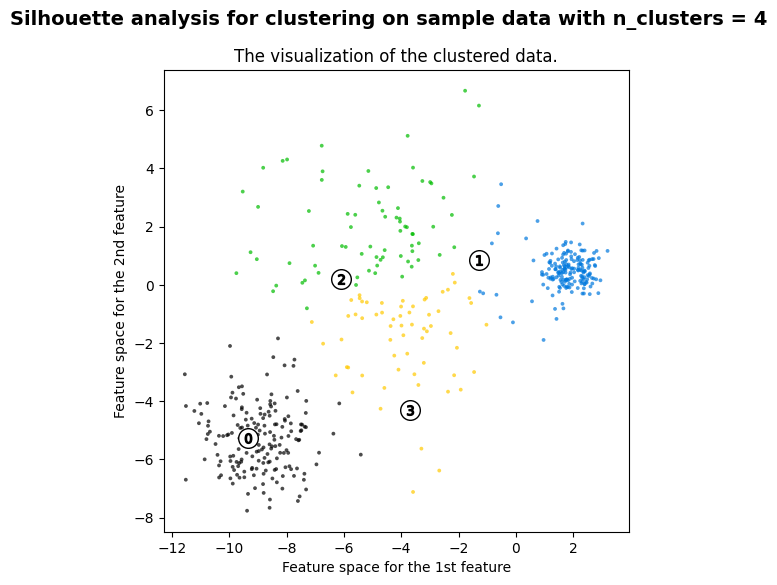

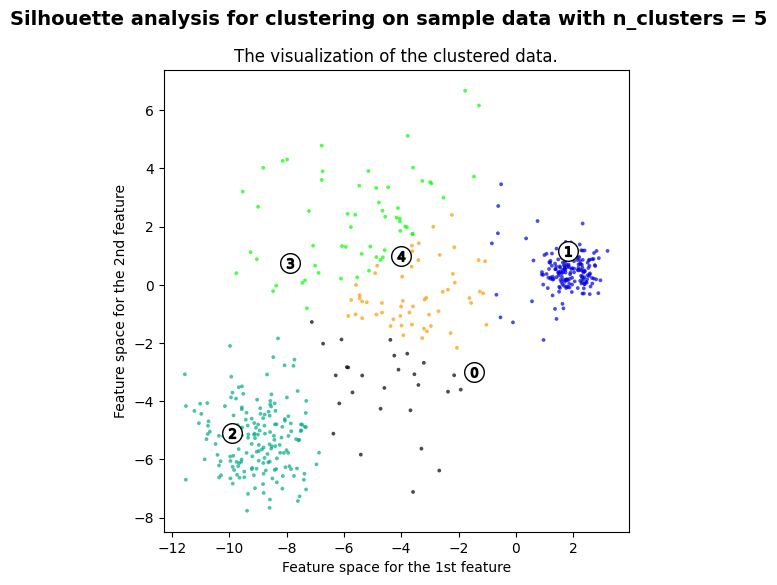

In [3]:
from sklearn.cluster import KMeans
from MachineLearningII.unsupervised.clustering.plot_clusters import plot_clusters
for dataset in datasets:
    for num_clusters in np.arange(start=1, stop=6):
        model = KMeans(num_clusters)
        model.fit(dataset)
        plot_clusters(dataset, model.labels_)



Scikit-learn extra K-Medoids
-

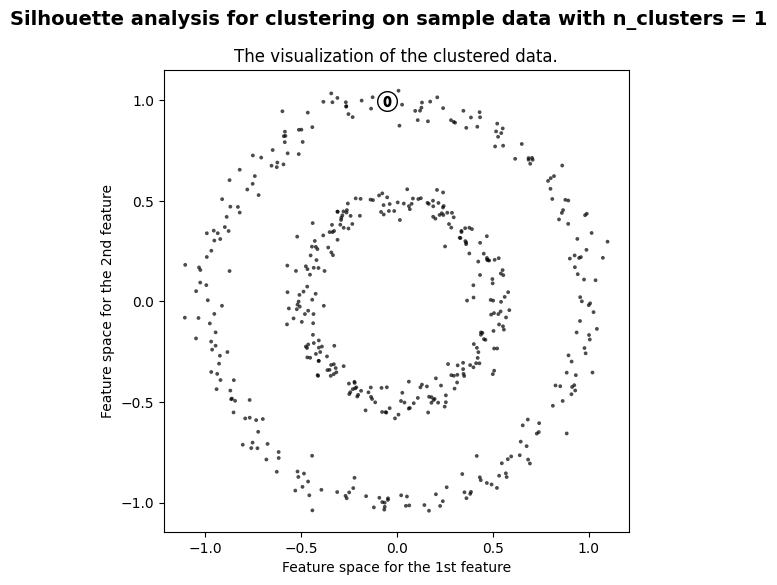

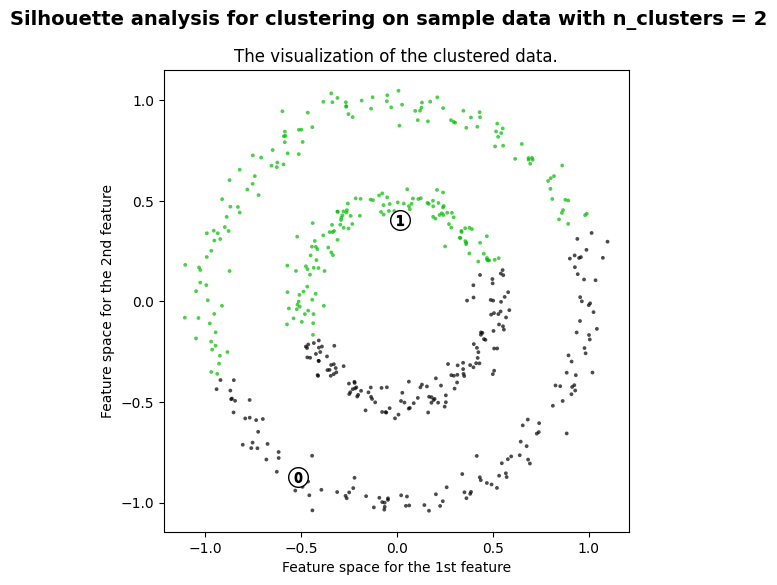

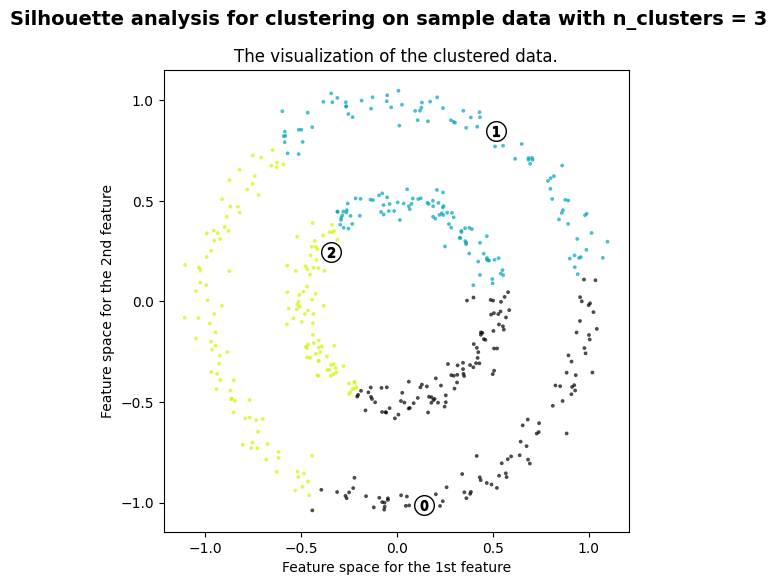

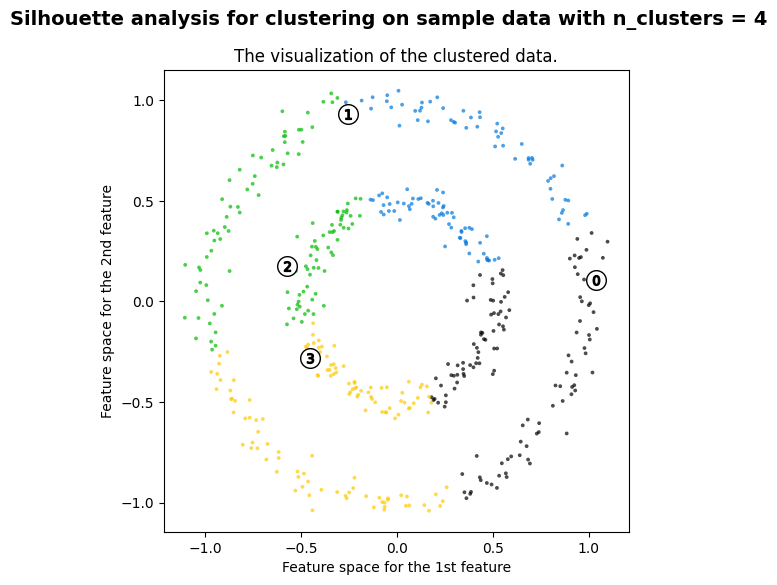

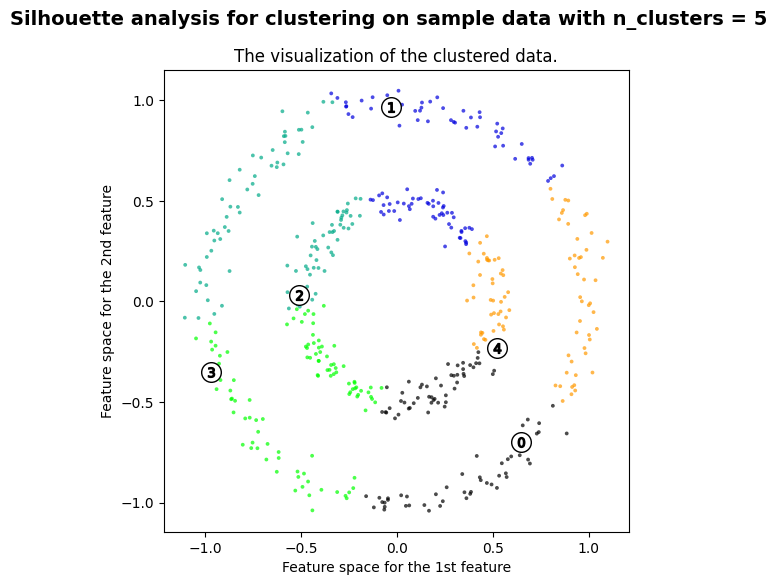

...

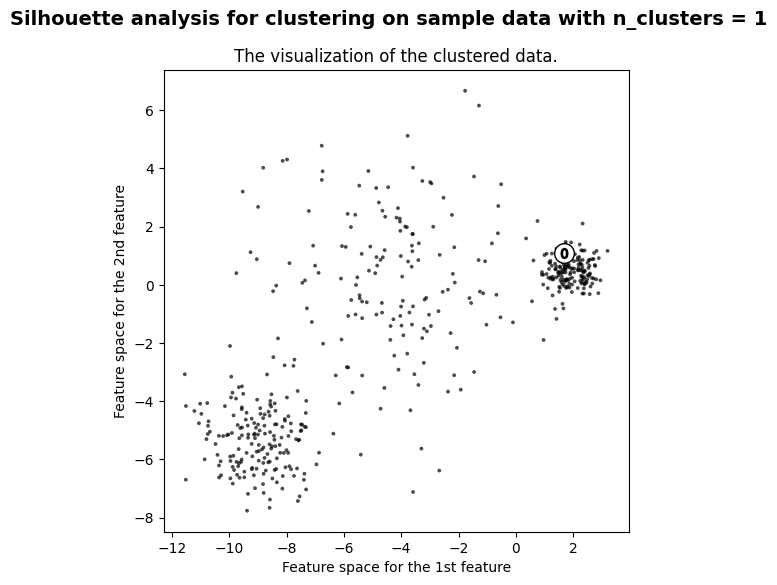

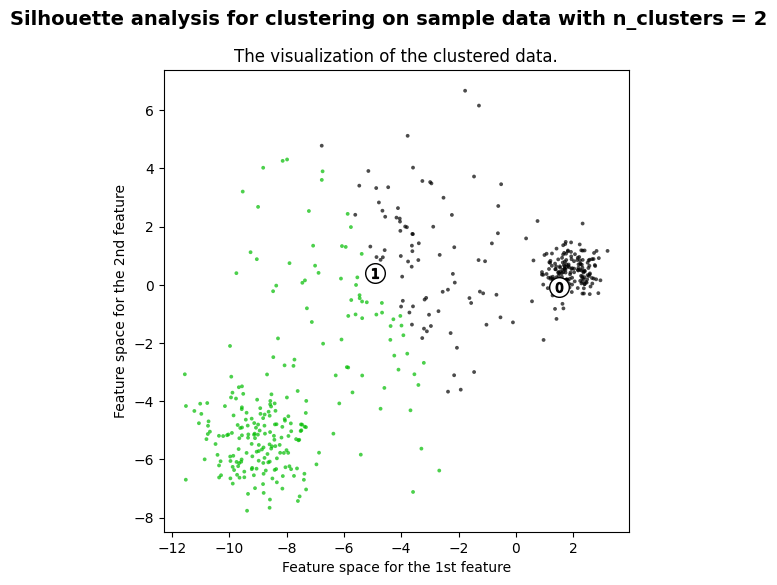

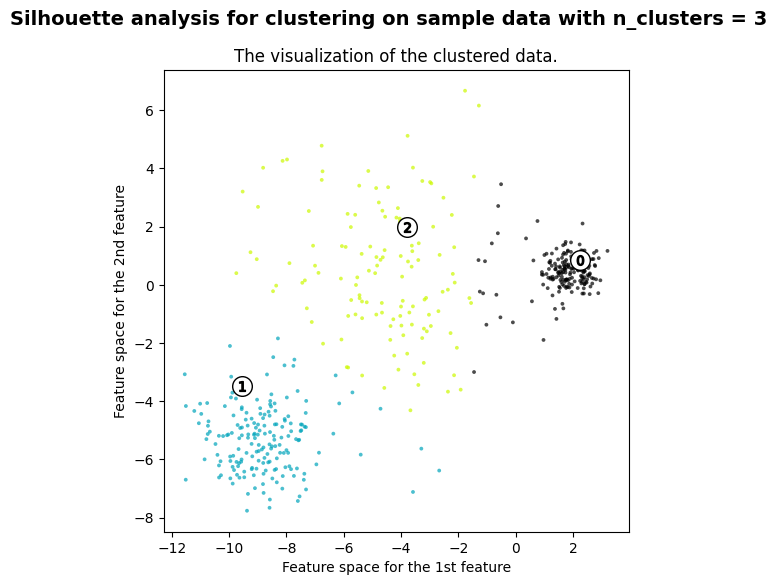

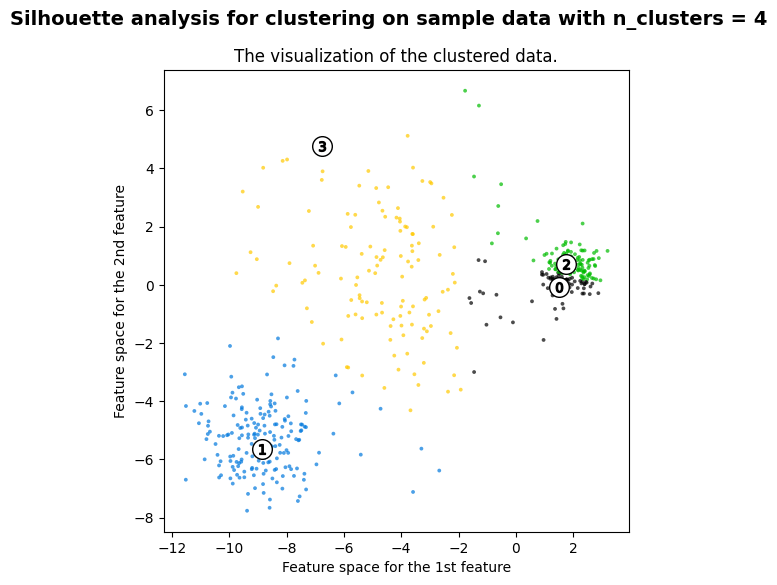

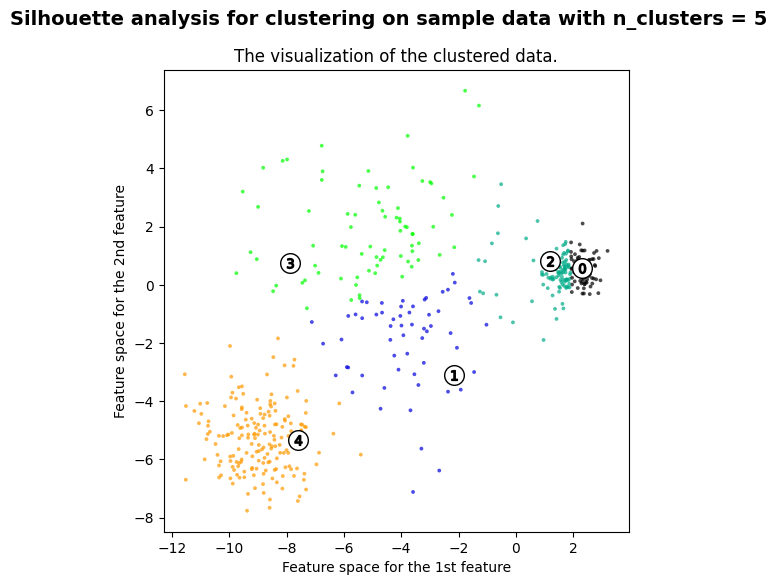

In [4]:
from sklearn_extra.cluster import KMedoids
for dataset in datasets:
    for num_clusters in np.arange(start=1, stop=6):
        model = KMedoids(num_clusters)
        model.fit(dataset)
        plot_clusters(dataset, model.labels_)

Scikit-learn DBSCAN
-

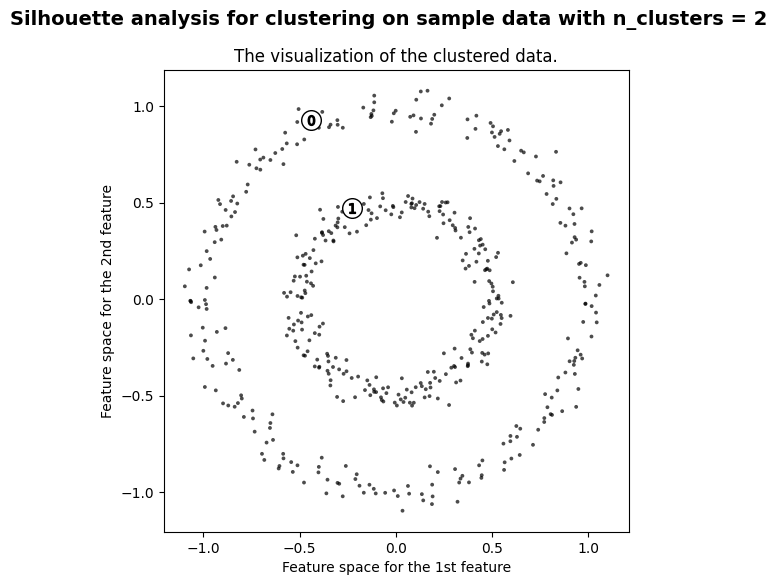

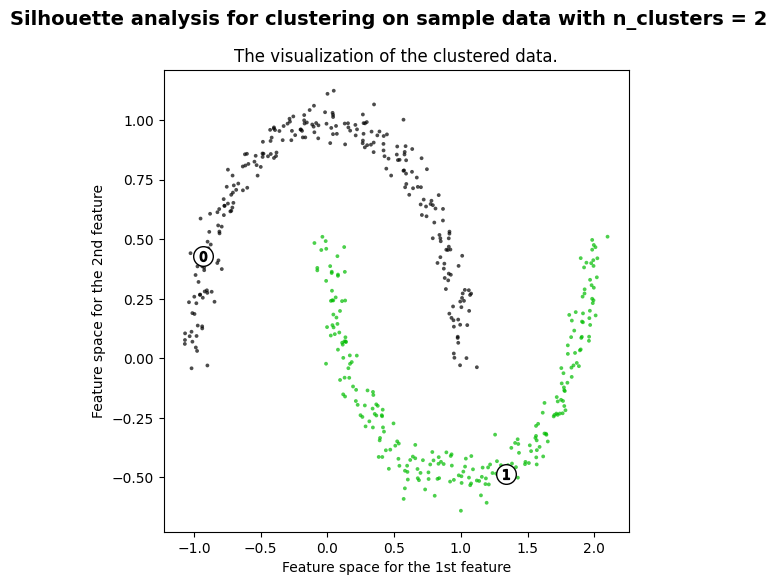

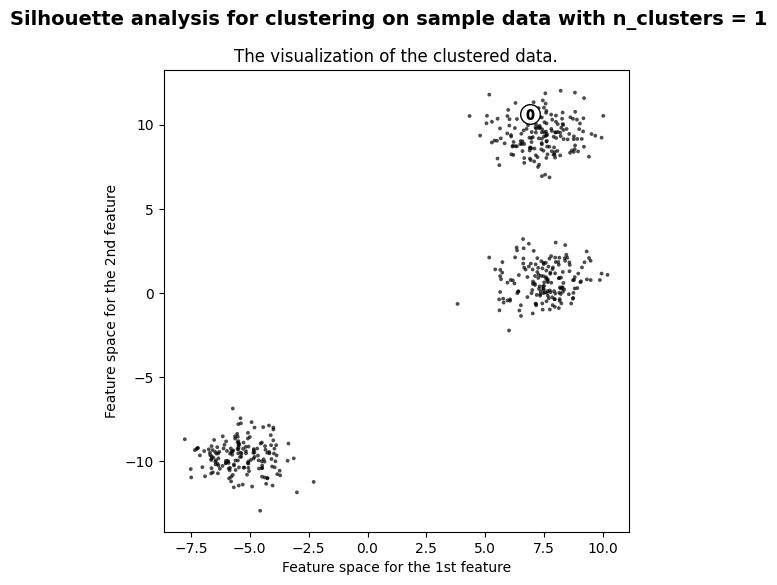

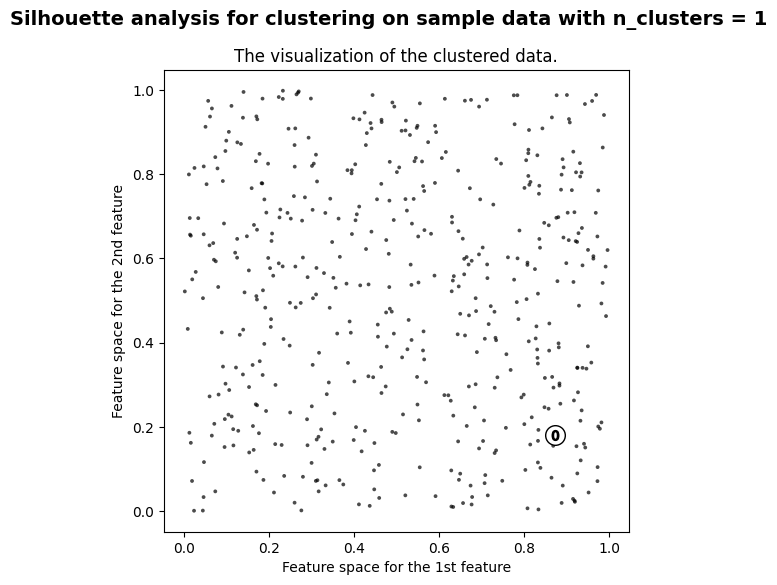

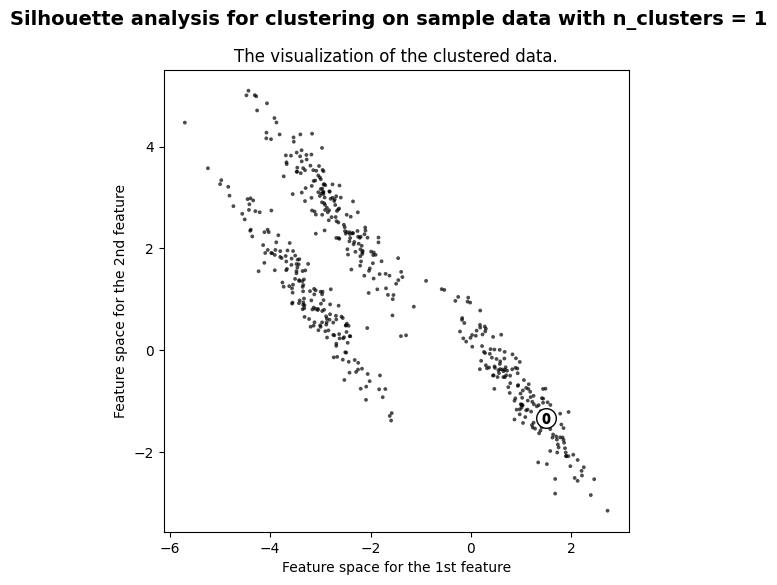

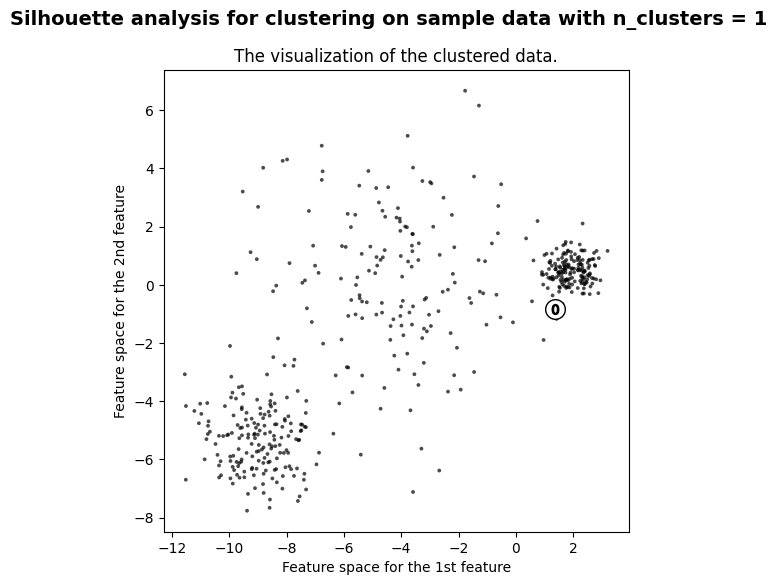

In [15]:
from sklearn.cluster import DBSCAN
for dataset in datasets:
    model = DBSCAN(eps=0.2, min_samples=20)
    model.fit(dataset)
    plot_clusters(dataset, model.labels_)

Scikit-learn Spectral Clustering
-

/Users/aclicona/Documents/Python/Especializacion/venv/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:285: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


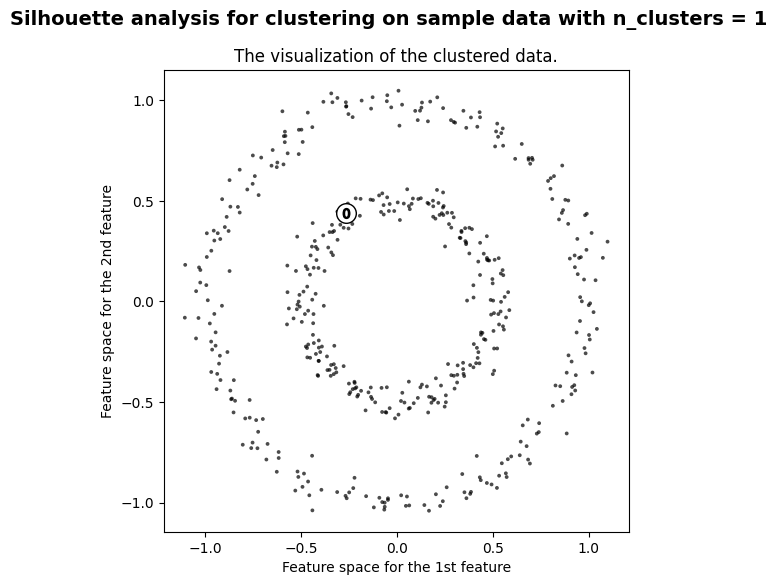

/Users/aclicona/Documents/Python/Especializacion/venv/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:285: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


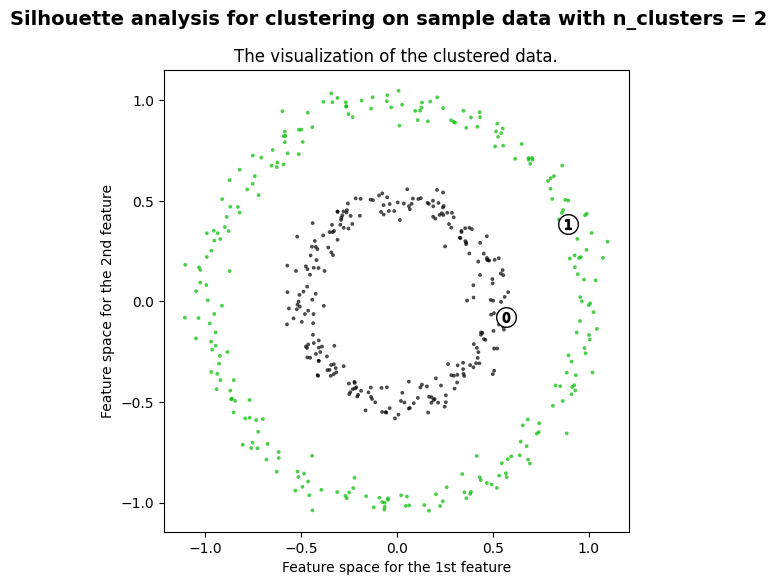

/Users/aclicona/Documents/Python/Especializacion/venv/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:285: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


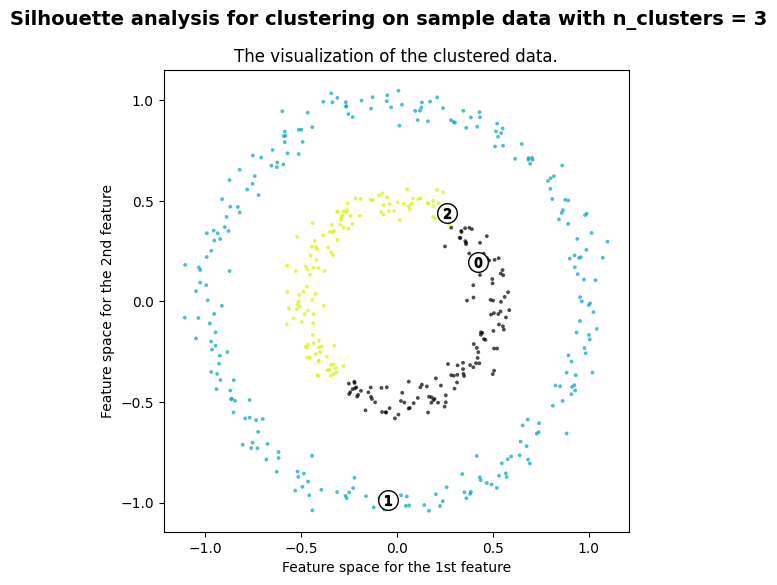

/Users/aclicona/Documents/Python/Especializacion/venv/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:285: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


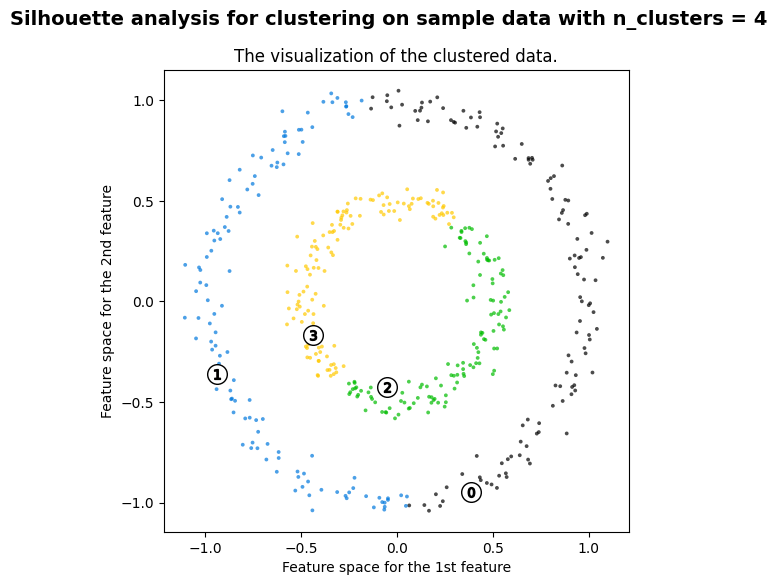

/Users/aclicona/Documents/Python/Especializacion/venv/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:285: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


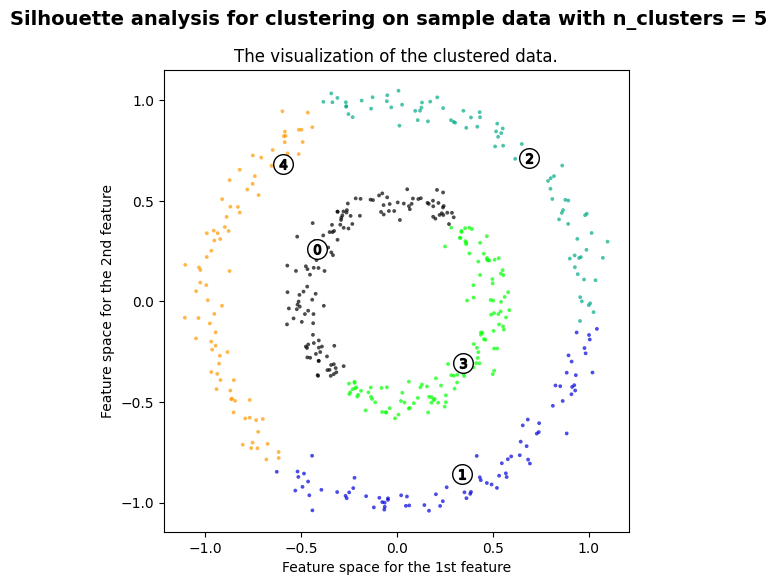

/Users/aclicona/Documents/Python/Especializacion/venv/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:285: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


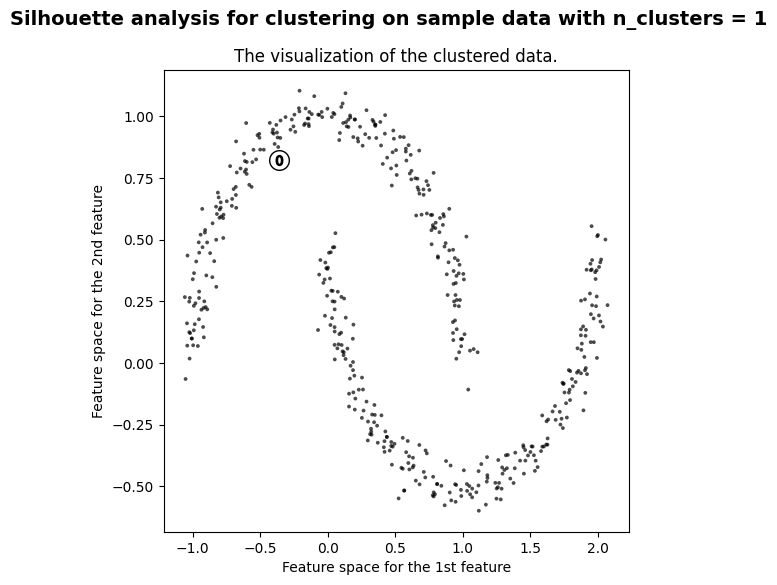

/Users/aclicona/Documents/Python/Especializacion/venv/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:285: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


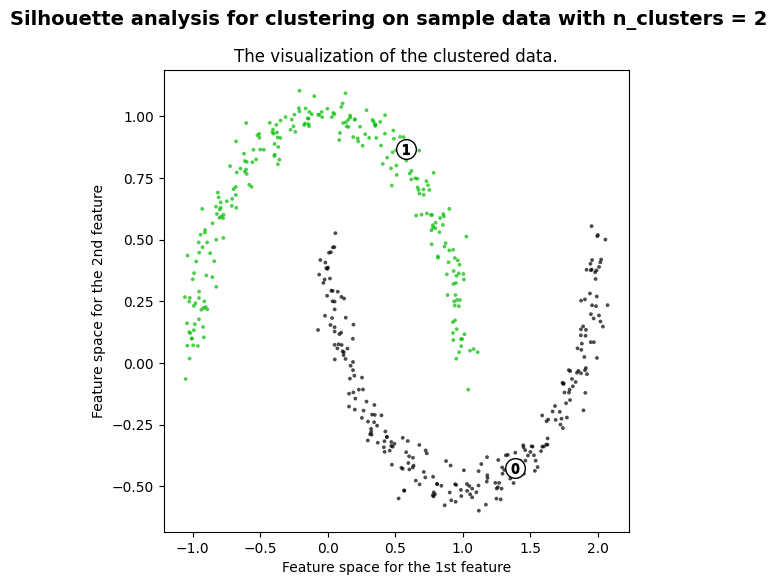

/Users/aclicona/Documents/Python/Especializacion/venv/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:285: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


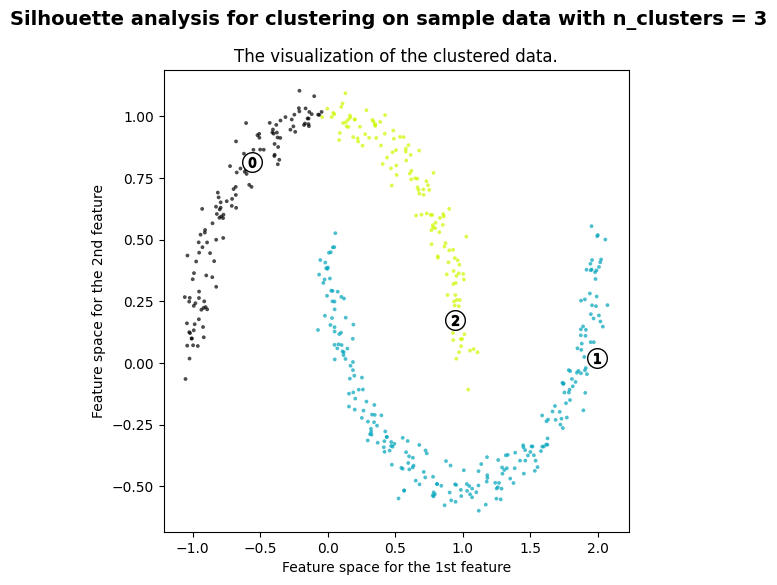

/Users/aclicona/Documents/Python/Especializacion/venv/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:285: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


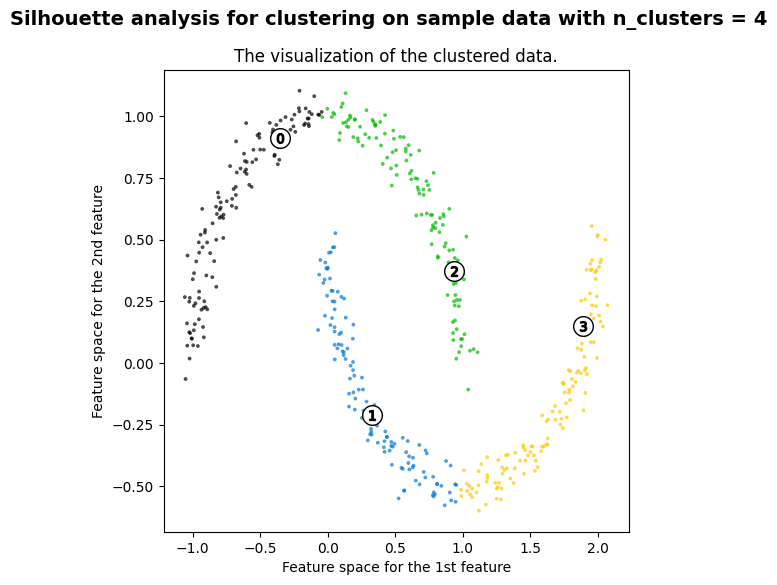

/Users/aclicona/Documents/Python/Especializacion/venv/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:285: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


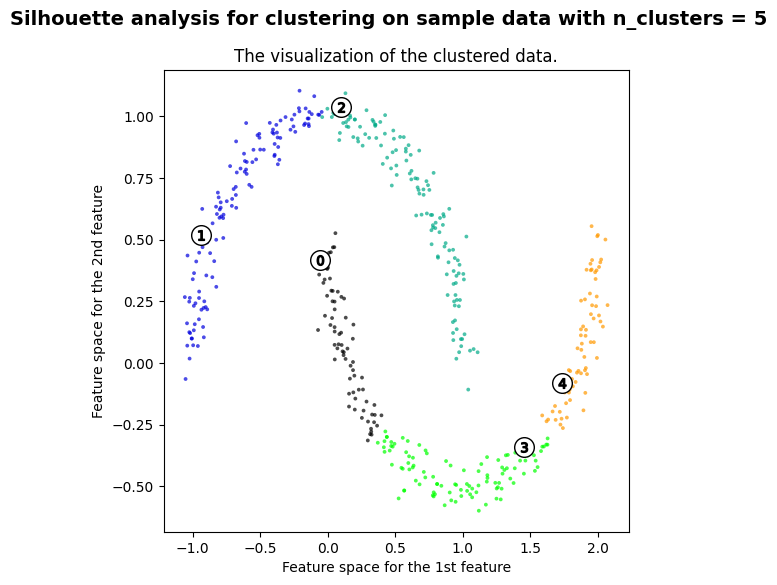

/Users/aclicona/Documents/Python/Especializacion/venv/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:285: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


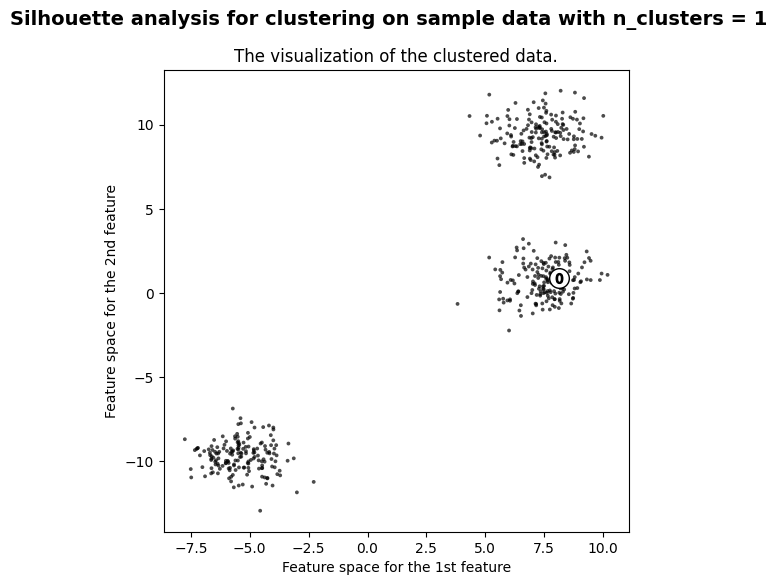

/Users/aclicona/Documents/Python/Especializacion/venv/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:285: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


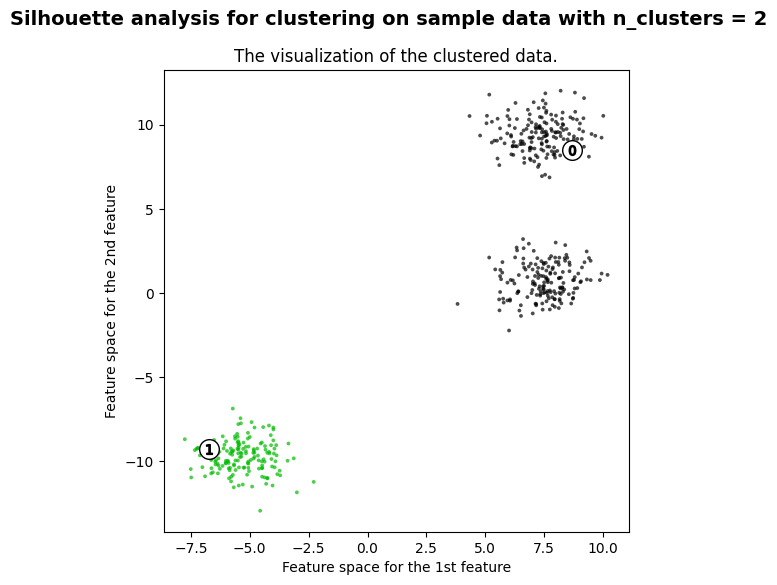

/Users/aclicona/Documents/Python/Especializacion/venv/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:285: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


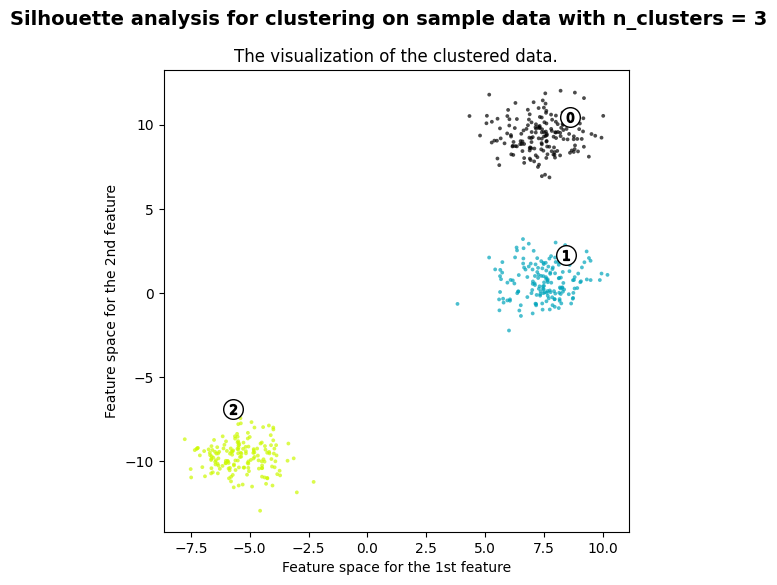

/Users/aclicona/Documents/Python/Especializacion/venv/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:285: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


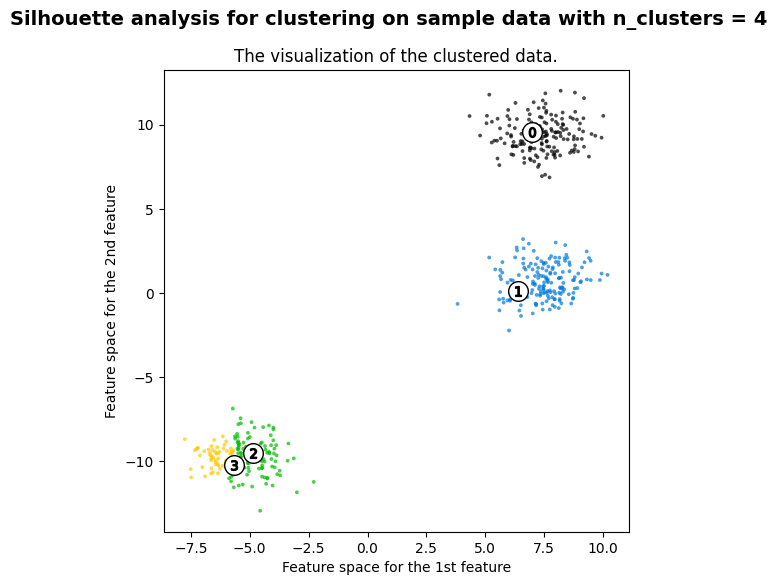

/Users/aclicona/Documents/Python/Especializacion/venv/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:285: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


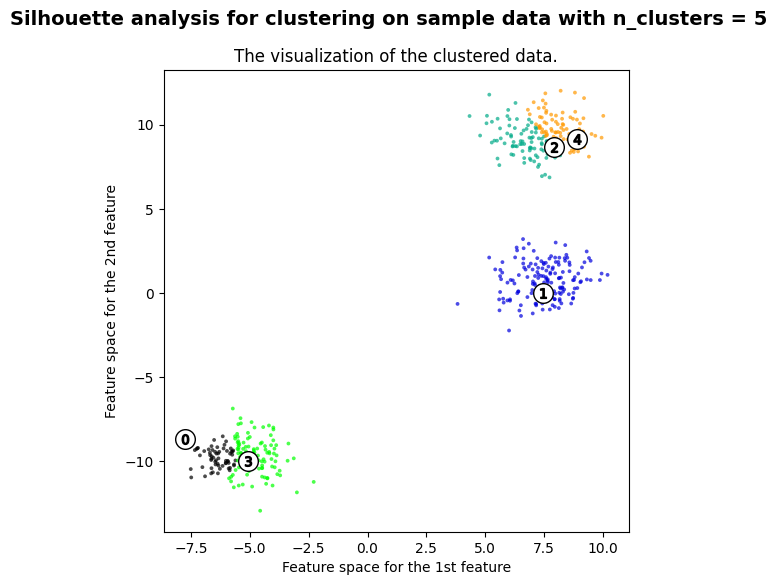

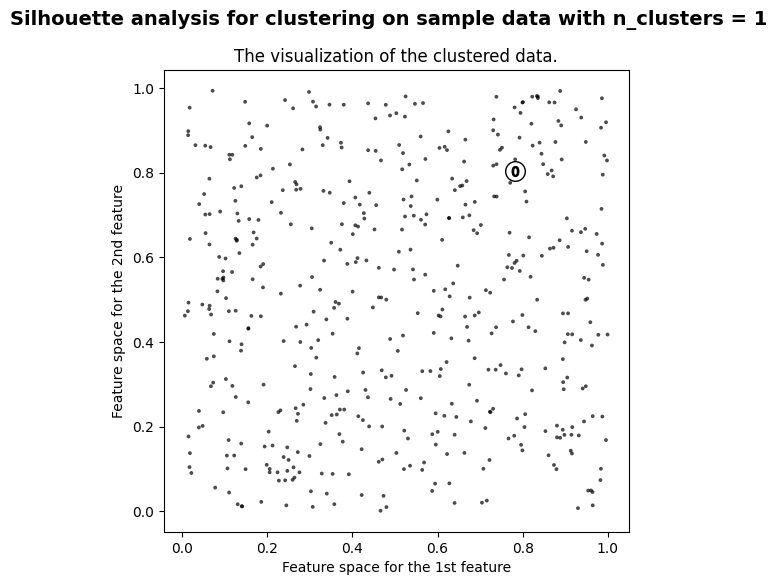

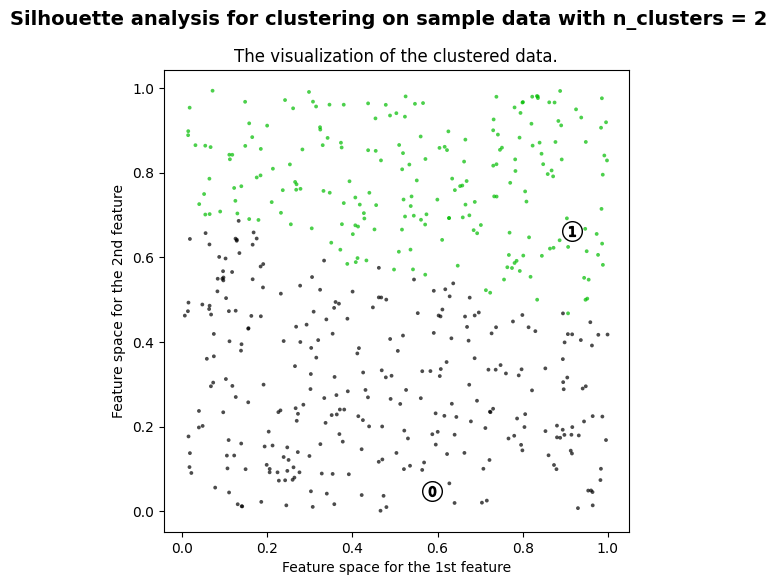

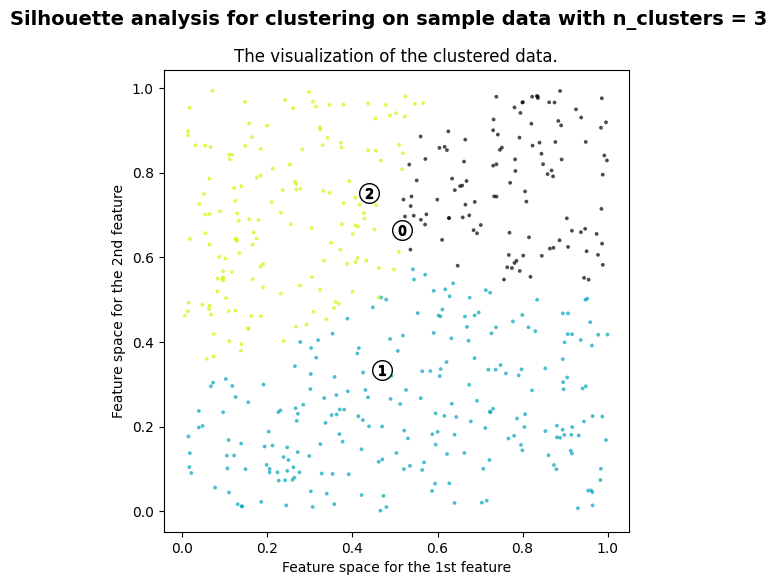

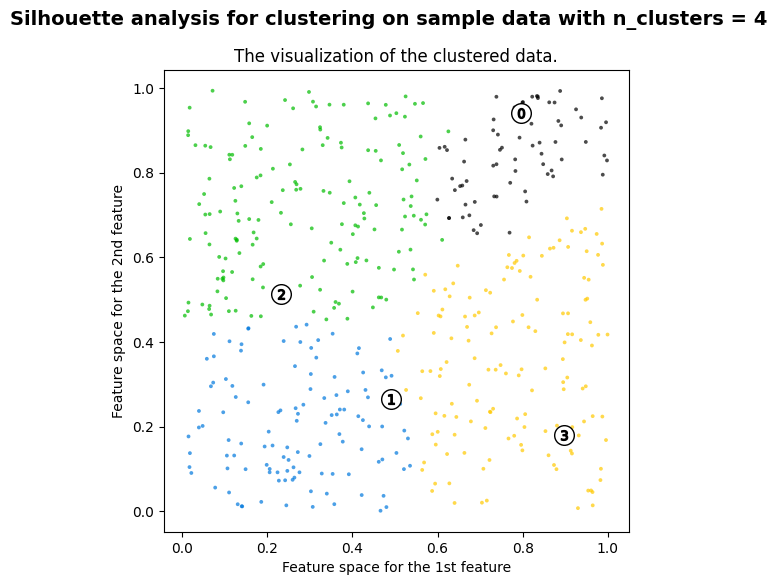

...

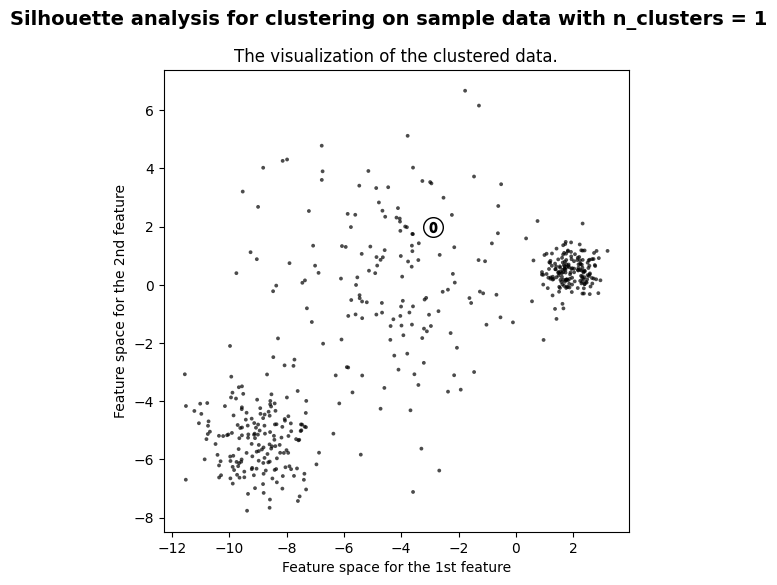

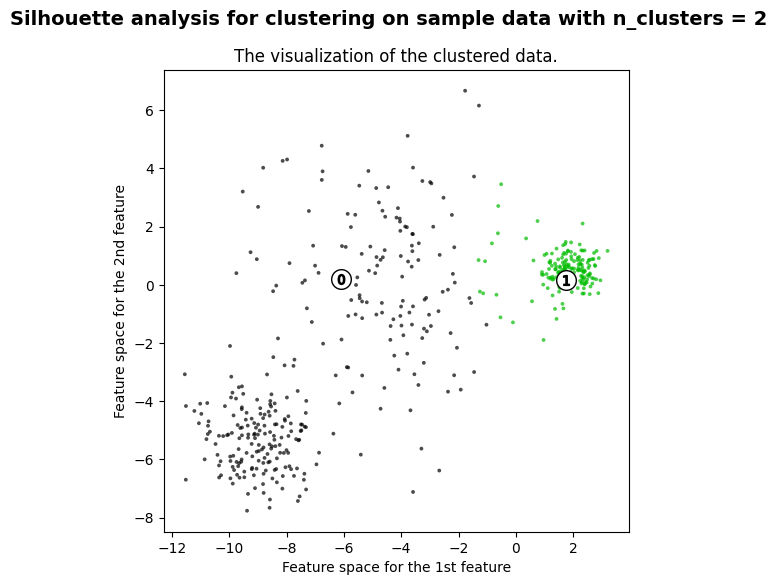

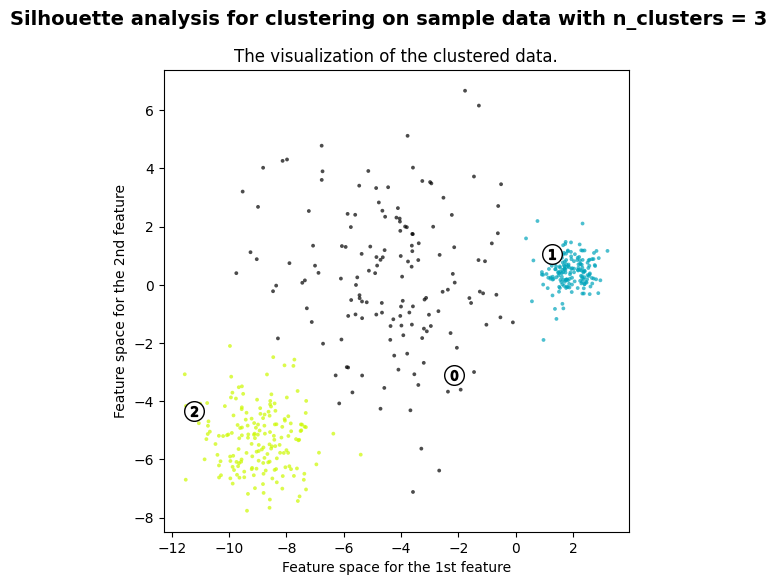

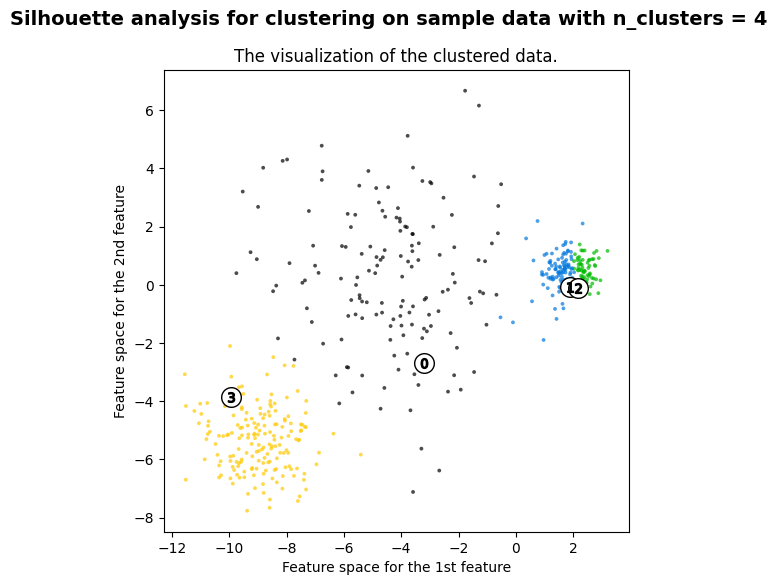

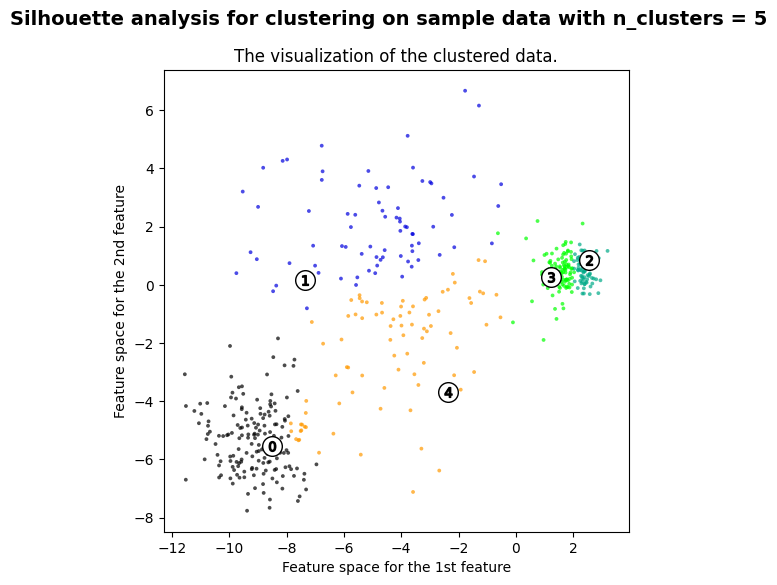

In [6]:
from sklearn.cluster import SpectralClustering
for dataset in datasets:
    for num_clusters in np.arange(start=1, stop=6):
        model = SpectralClustering(
            n_clusters=num_clusters,
            eigen_solver="arpack",
            affinity="nearest_neighbors",
        )
        model.fit(dataset)
        plot_clusters(dataset, model.labels_)

Clustering Algorithm Performance Comparison
-------------------------------------------

In this markdown, we will compare the performance of three clustering algorithms: K-means, K-medoids, and Spectral Clustering. We will evaluate the algorithms on six different datasets:

*   Noisy circular
*   Noisy moons
*   Anisotropically distributed
*   Blobs
*   Unstructured 
*   varied variances

**K-Means**

K-means performed well on the blobs dataset and had a good performance on the unstructured and varied variances dataset. However, it did not perform well on the noisy circular, noisy moons, and anisotropically distributed datasets.

**K-Medoids**

K-medoids had a performance almost identical to K-means. It performed well on the blobs dataset and had a good performance on the unstructured and varied variances dataset. However, it did not perform well on the noisy circular, noisy moons, and anisotropically distributed datasets.

**DBSCAN**

DBSCAN performed well on the noisy moons dataset. However, it did not perform well on the noisy circular, blobs, anisotropically distributed, and varied variances datasets.

**Spectral Clustering**

Spectral Clustering obtained the best results, correctly clustering all six datasets.

**Conclusion**

Spectral Clustering is the best clustering algorithm for the datasets considered in this study. K-means and K-medoids are viable alternatives for datasets that are not too noisy or anisotropically distributed. DBSCAN is a good choice for datasets with noisy moons.

**Additional Information:**

*   The following table summarizes the performance of each algorithm on each dataset:

</span><div class="table-block-component"><table-block _nghost-ng-c964795364="" ng-version="0.0.0-PLACEHOLDER" class=""><div _ngcontent-ng-c964795364="" class="table-block"><div _ngcontent-ng-c964795364="" class="table-content"><table data-sourcepos="35:1-41:64"><tbody><tr data-sourcepos="35:1-35:64"><th data-sourcepos="35:1-35:9">Dataset</th><th data-sourcepos="35:11-35:19">K-Means</th><th data-sourcepos="35:21-35:31">K-Medoids</th><th data-sourcepos="35:33-35:40">DBSCAN</th><th data-sourcepos="35:42-35:62">Spectral Clustering</th></tr><tr data-sourcepos="37:1-37:43"><td data-sourcepos="37:1-37:16">Noisy circular</td><td data-sourcepos="37:18-37:22">Bad</td><td data-sourcepos="37:24-37:28">Bad</td><td data-sourcepos="37:30-37:34">Bad</td><td data-sourcepos="37:36-37:41">Good</td></tr><tr data-sourcepos="38:1-38:41"><td data-sourcepos="38:1-38:13">Noisy moons</td><td data-sourcepos="38:15-38:19">Bad</td><td data-sourcepos="38:21-38:25">Bad</td><td data-sourcepos="38:27-38:32">Good</td><td data-sourcepos="38:34-38:39">Good</td></tr><tr data-sourcepos="39:1-39:56"><td data-sourcepos="39:1-39:29">Anisotropically distributed</td><td data-sourcepos="39:31-39:35">Bad</td><td data-sourcepos="39:37-39:41">Bad</td><td data-sourcepos="39:43-39:47">Bad</td><td data-sourcepos="39:49-39:54">Good</td></tr><tr data-sourcepos="40:1-40:36"><td data-sourcepos="40:1-40:7">Blobs</td><td data-sourcepos="40:9-40:14">Good</td><td data-sourcepos="40:16-40:21">Good</td><td data-sourcepos="40:23-40:27">Bad</td><td data-sourcepos="40:29-40:34">Good</td></tr><tr data-sourcepos="41:1-41:64"><td data-sourcepos="41:1-41:35">Unstructured and varied variances</td><td data-sourcepos="41:37-41:42">Good</td><td data-sourcepos="41:44-41:49">Good</td><td data-sourcepos="41:51-41:55">Bad</td><td data-sourcepos="41:57-41:62">Good</td></tr></tbody></table></div>

*   The following are some possible reasons for the different performances of the algorithms:
    
    *   K-means and K-medoids are sensitive to noise and outliers.
    *   DBSCAN is not good at handling clusters of different sizes.
    *   Spectral Clustering is a more robust algorithm that can handle noise, outliers, and clusters of different sizes.
    

**Note:**

The above analysis is based on a synthetic dataset. The results may vary depending on the actual data used.
DBSCAN can be a powerful model but the parameter eps (the maximum distance between two samples fo one to be considered as in the neighborhood of the other)  could be tricky and this is the most importante parameter to choosefor a good clusterization.


